# Base Ifood

## 1. Setup da Base

In [0]:
spark

SparkSession - hive 
 
 
 SparkContext 

 Spark UI 

 
 Version 
 v2.4.5 
 Master 
 local[8] 
 AppName 
 Databricks Shell

### Funções e Dataframes

In [0]:
#criação dos dataframes para utilização na analise exploratoria

df_custseg = spark.read.parquet('/dbfs/FileStore/ifood/customer_segmentation')
df_push = spark.read.parquet('/dbfs/FileStore/ifood/marketing_push_full')
df_orders = spark.read.parquet('/dbfs/FileStore/ifood/orders')
df_ordersrev = spark.read.parquet('/dbfs/FileStore/ifood/orders_with_cost_revenue')
df_visits = spark.read.parquet('/dbfs/FileStore/ifood/sessions_visits')

In [0]:
#Imports
from pyspark.sql.functions import count, when, isnull, col, round
from pyspark.ml.feature import VectorAssembler
from pyspark.ml.stat import Correlation

In [0]:
#função desviopadrao - calcular outliers

def desvpad(df, col):
  valor_desvio_padrao = df.agg({col:'stddev'}).collect()[0][0]
  valor_media = df.agg({col:'mean'}).collect()[0][0]
  limite_superior = valor_media + (3 * valor_desvio_padrao)
  limite_inferior = valor_media - (3 * valor_desvio_padrao)
  desvpadcount = df.filter(
    (df[col] < limite_superior) &
    (df[col] > limite_inferior)
  ).count()
  return print('contagem sem outlier de', col, '=', desvpadcount)

In [0]:
#Funções
#correlaçao
def correlacao(df, campos):
  assembler = VectorAssembler( inputCols = campos, outputCol = 'features') #assumindo que são numéricos
  df_features = assembler.transform(df)
  r1 = Correlation.corr(df_features, 'features').head()
  return spark.createDataFrame(r1[0].toArray().tolist(), campos)

#check de missings
def check_missing(df):
  total_linhas = df.count()
  aux = []
  for c in df.columns:
    aux.append(count(when(isnull(c), c)).alias(c))
  df = df.select(aux)  
  colunas = df.columns
  total_missing = list(df.first().asDict().values())
  valores = list(zip(colunas, total_missing))
  df_aux = spark.createDataFrame(valores, ['variaveis', 'total_missing'])
  return df_aux.withColumn('perc_missing', round((col('total_missing') / total_linhas) * 100, 2))

### Tratando missing e removendo colunas

###### customer_segmentation

In [0]:
# Contar a quantidade de missing
from pyspark.sql.functions import isnull, when, count, col

aux = []
for c in df_custseg.columns:
  aux.append(count(when(isnull(c), c)).alias(c))

display(df_custseg.select(aux))

customer_id,segmentation_month,ifood_status_last_month,ifood_status,orders_last_91d,qtt_orders_last_year,qtt_valid_orders,last_valid_order_date,qtt_invalid_orders,last_invalid_order_date,marlin_tag,recency_months,last_nps,registration_date,customer_lifetime_days,customer_lifetime_months,top_3_merchants_code,was_mub_last_month,buyer_last_91d,top_city,top_district,top_centroid_id,first_order_date,last_order_date,days_to_reorder_at_datasource,days_to_reorder_at_concluded,rfv_score,recency_days,recency_days_bucket,recency_days_bucket_description,freq_last_91d,freq_last_91d_bucket,freq_last_91d_bucket_description,avg_aov_last_91d,maturity_orders,maturity_orders_bucket,maturity_orders_bucket_description,benefits_sensitivity,benefits_sensitivity_bucket,preferred_shift_bucket,preferred_shift_bucket_description,merchant_variety,merchant_variety_bucket,merchant_offer,merchant_offer_bucket,merchant_offer_bucket_description,top_dish_bucket,top_dish_bucket_description,preferred_dishes,preferred_dishes_code
0,0,0,0,6,0,0,6,0,117861,6,6,0,110,0,0,6,0,0,0,6,6,6,6,18399,19421,6,6,6,6,6,6,6,6,6,6,6,6,6,0,55060,6,6,6,0,6,0,6,6,6


In [0]:
display(check_missing(df_custseg).sort('total_missing', ascending=False))

variaveis,total_missing,perc_missing
last_invalid_order_date,117861,56.03
preferred_shift_bucket_description,55060,26.17
days_to_reorder_at_concluded,19421,9.23
days_to_reorder_at_datasource,18399,8.75
registration_date,110,0.05
preferred_dishes_code,6,0.0
marlin_tag,6,0.0
top_dish_bucket_description,6,0.0
merchant_variety_bucket,6,0.0
merchant_offer,6,0.0


In [0]:
df_custseg = df_custseg.drop('last_invalid_order_date', 'preferred_shift_bucket_description') #removendo colunas onde o missing é superior a 25%

In [0]:
# tratando os missings de days_to_reorder_at_concluded
media_days_to_reorder_at_concluded = df_custseg[['days_to_reorder_at_concluded']].agg({'days_to_reorder_at_concluded': 'mean'}).collect()[0][0]
df_custseg = df_custseg.fillna(media_days_to_reorder_at_concluded, subset=['days_to_reorder_at_concluded'])

In [0]:
# tratando os missings de days_to_reorder_at_datasource
media_days_to_reorder_at_datasource = df_custseg[['days_to_reorder_at_datasource']].agg({'days_to_reorder_at_datasource': 'mean'}).collect()[0][0]
df_custseg = df_custseg.fillna(media_days_to_reorder_at_datasource, subset=['days_to_reorder_at_datasource'])

In [0]:
df_custseg = df_custseg.dropna() #dropando as linhas dos demais casos onde temos missing.

In [0]:
#verificando se todos os missings foram tratados
display(check_missing(df_custseg).sort('total_missing', ascending=False)) 

variaveis,total_missing,perc_missing
merchant_offer_bucket,0,0.0
merchant_offer_bucket_description,0,0.0
top_dish_bucket,0,0.0
top_dish_bucket_description,0,0.0
preferred_dishes,0,0.0
preferred_dishes_code,0,0.0
qtt_valid_orders,0,0.0
last_valid_order_date,0,0.0
qtt_invalid_orders,0,0.0
marlin_tag,0,0.0


###### marketing_push_full

In [0]:
# Contar a quantidade de missing
from pyspark.sql.functions import isnull, when, count, col

aux = []
for c in df_push.columns:
  aux.append(count(when(isnull(c), c)).alias(c))

display(df_push.select(aux))

event_channel,event_name,brand,sample_type,user_id,external_user_id,event_time_utc3,platform,campaign_id,campaign_name,message_variation_channel,canvas_name,canvas_step_id,canvas_is_first_step,canvas_first_step_name,canvas_step_name,canvas_real_step_name,canvas_step_index,canvas_tags,send_id,event_date
0,0,0,0,0,0,0,157142,4638285,4638287,6042795,27542381,27543369,13672374,28405316,27543807,27543807,27543807,28405316,28426642,0


In [0]:
display(check_missing(df_push).sort('total_missing', ascending=False))

variaveis,total_missing,perc_missing
send_id,28426642,100.0
canvas_first_step_name,28405316,99.92
canvas_tags,28405316,99.92
canvas_real_step_name,27543807,96.89
canvas_step_name,27543807,96.89
canvas_step_index,27543807,96.89
canvas_step_id,27543369,96.89
canvas_name,27542381,96.89
canvas_is_first_step,13672374,48.1
message_variation_channel,6042795,21.26


In [0]:
#removendo colunas onde o missing é superior a 20%
df_push = df_push.drop('send_id', 'canvas_tags', 'canvas_first_step_name', 'canvas_step_name', 'canvas_real_step_name', 'canvas_step_index', 'canvas_step_id', 'canvas_name', 'canvas_is_first_step', 'message_variation_channel' )

In [0]:
print(df_push.count())
df_push = df_push.dropna() #dropando as linhas dos demais casos onde temos missing.
print(df_push.count())

28426642
23632201

In [0]:
#verificando se todos os missings foram tratados
display(check_missing(df_push).sort('total_missing', ascending=False)) 

variaveis,total_missing,perc_missing
user_id,0,0.0
campaign_name,0,0.0
event_date,0,0.0
campaign_id,0,0.0
event_channel,0,0.0
event_time_utc3,0,0.0
platform,0,0.0
external_user_id,0,0.0
brand,0,0.0
sample_type,0,0.0


###### orders

In [0]:
# Contar a quantidade de missing
from pyspark.sql.functions import isnull, when, count, col

aux = []
for c in df_orders.columns:
  aux.append(count(when(isnull(c), c)).alias(c))

display(df_orders.select(aux))

order_id,order_number,order_timestamp_local,order_shift,last_status_date_local,order_total,credit,paid_amount,delivery_type,scheduled,scheduled_creation_date_local,device_app_version,device_type,device_platform,payment_method,customer_state_label,customer_city,customer_district,customer_centroid_id,customer_has_plus,customer_seg_status_last_month,customer_seg_recency_bucket,customer_seg_frequency_bucket,customer_seg_merchant_offer_bucket,customer_seg_benefits_sensitivity_bucket,customer_seg_marlin_tag,customer_seg_gross_income_bucket,customer_seg_preferred_shift,frn_id,merchant_city,merchant_district,merchant_centroid_id,merchant_dish_type,distance_merchant_customer,promo_is_promotion,normal_items_quantity,promo_items_quantity,order_lag_at_login,order_lead_at_login,order_date_local,valid_order,session_id,customer_id
0,0,0,0,0,0,0,0,0,0,0,2553,1,0,0,0,0,0,0,291126,8301,8417,8417,8301,8417,60587,8301,195687,0,0,0,0,0,0,1,1,1,5090,13431,0,0,8346,0


In [0]:
display(check_missing(df_orders).sort('total_missing', ascending=False))

variaveis,total_missing,perc_missing
customer_has_plus,291126,59.16
customer_seg_preferred_shift,195687,39.76
customer_seg_marlin_tag,60587,12.31
order_lead_at_login,13431,2.73
customer_seg_benefits_sensitivity_bucket,8417,1.71
customer_seg_frequency_bucket,8417,1.71
customer_seg_recency_bucket,8417,1.71
session_id,8346,1.7
customer_seg_gross_income_bucket,8301,1.69
customer_seg_status_last_month,8301,1.69


In [0]:
df_orders = df_orders.drop('customer_has_plus', 'customer_seg_preferred_shift') #removendo colunas onde o missing é superior a 25%

In [0]:
fillmarlintag = '0. sem segmento'
df_orders = df_orders.fillna(fillmarlintag, subset=['customer_seg_marlin_tag'])

In [0]:
def truncate(n):
  n1 = (int(n * 10) / 10) - (int(n * 1) / 1)
  if n1 >= 0.5: 
    return int((n * 1) / 1)+1
  else: 
    return int(n * 1) / 1

In [0]:
 # tratando os missings de order_lead_at_login
media_order_lead_at_login = df_orders[['order_lead_at_login']].agg({'order_lead_at_login': 'mean'}).collect()[0][0]
media_order_lead_at_login = truncate(media_order_lead_at_login)
df_orders = df_orders.fillna(media_order_lead_at_login, subset=['order_lead_at_login'])

In [0]:
df_orders = df_orders.dropna() #dropando as linhas dos demais casos onde temos missing.

In [0]:
display(check_missing(df_orders).sort('total_missing', ascending=False))

variaveis,total_missing,perc_missing
order_id,0,0.0
order_number,0,0.0
order_timestamp_local,0,0.0
order_shift,0,0.0
last_status_date_local,0,0.0
customer_state_label,0,0.0
customer_city,0,0.0
customer_district,0,0.0
customer_centroid_id,0,0.0
customer_seg_status_last_month,0,0.0


######orders_with_cost_revenue

In [0]:
# Contar a quantidade de missing
from pyspark.sql.functions import isnull, when, count, col

aux = []
for c in df_ordersrev.columns:
  aux.append(count(when(isnull(c), c)).alias(c))

display(df_ordersrev.select(aux))

customer_id,order_number,cohort_month,first_order_date,months_after_first_purchase,frn_id,general_net_profit,order_date_local
0,0,0,0,0,0,0,0


In [0]:
display(check_missing(df_ordersrev).sort('total_missing', ascending=False)) #não foram encontrados missings nesta base

variaveis,total_missing,perc_missing
cohort_month,0,0.0
customer_id,0,0.0
order_number,0,0.0
general_net_profit,0,0.0
order_date_local,0,0.0
months_after_first_purchase,0,0.0
frn_id,0,0.0
first_order_date,0,0.0


###### sessions_visits

In [0]:
# Contar a quantidade de missing
from pyspark.sql.functions import isnull, when, count, col

aux = []
for c in df_visits.columns:
  aux.append(count(when(isnull(c), c)).alias(c))

display(df_visits.select(aux))

session_id,dau,platform,user_identifier,user_account_uuid,session_started_at_amsp,session_ended_at_amsp,session_started_at_utc0,session_ended_at_utc0,session_duration_seconds,device_model,device_manufacturer,sum_event_open,sum_view_restaurant_screen,sum_view_dish_screen,sum_click_add_item,sum_view_checkout,sum_callback_purchase,order_session_quantity,first_order_origin_feature,media_network
0,0,0,24916,24917,0,2077,0,2077,2077,0,0,128,15264,5730,7069,1925,1352,1773,2214,453445


In [0]:
display(check_missing(df_visits).sort('total_missing', ascending=False))

variaveis,total_missing,perc_missing
media_network,453445,97.81
user_account_uuid,24917,5.37
user_identifier,24916,5.37
sum_view_restaurant_screen,15264,3.29
sum_click_add_item,7069,1.52
sum_view_dish_screen,5730,1.24
first_order_origin_feature,2214,0.48
session_ended_at_utc0,2077,0.45
session_duration_seconds,2077,0.45
session_ended_at_amsp,2077,0.45


In [0]:
df_visits = df_visits.drop('media_network') #removendo colunas onde o missing é superior a 25%

In [0]:
media_sum_view_restaurant_screen = df_visits[['sum_view_restaurant_screen']].agg({'sum_view_restaurant_screen': 'mean'}).collect()[0][0]
media_sum_view_restaurant_screen = truncate(media_sum_view_restaurant_screen)
df_visits = df_visits.fillna(media_sum_view_restaurant_screen, subset=['sum_view_restaurant_screen'])

In [0]:
media_sum_click_add_item = df_visits[['sum_click_add_item']].agg({'sum_click_add_item': 'mean'}).collect()[0][0]
media_sum_click_add_item = truncate(media_sum_click_add_item)
df_visits = df_visits.fillna(media_sum_click_add_item, subset=['sum_click_add_item'])

In [0]:
media_sum_view_dish_screen = df_visits[['sum_view_dish_screen']].agg({'sum_view_dish_screen': 'mean'}).collect()[0][0]
media_sum_view_dish_screen = truncate(media_sum_view_dish_screen)
df_visits = df_visits.fillna(media_sum_view_dish_screen, subset=['sum_view_dish_screen'])

In [0]:
media_session_duration_seconds = df_visits[['session_duration_seconds']].agg({'session_duration_seconds': 'mean'}).collect()[0][0]
media_session_duration_seconds = truncate(media_session_duration_seconds)
df_visits = df_visits.fillna(media_session_duration_seconds, subset=['session_duration_seconds'])

In [0]:
media_sum_view_checkout = df_visits[['sum_view_checkout']].agg({'sum_view_checkout': 'mean'}).collect()[0][0]
media_sum_view_checkout = truncate(media_sum_view_checkout)
df_visits = df_visits.fillna(media_sum_view_checkout, subset=['sum_view_checkout'])

In [0]:
media_sum_callback_purchase = df_visits[['sum_callback_purchase']].agg({'sum_callback_purchase': 'mean'}).collect()[0][0]
media_sum_callback_purchase = truncate(media_sum_callback_purchase)
df_visits = df_visits.fillna(media_sum_callback_purchase, subset=['sum_callback_purchase'])

In [0]:
media_sum_event_open = df_visits[['sum_event_open']].agg({'sum_event_open': 'mean'}).collect()[0][0]
media_sum_event_open = truncate(media_sum_event_open)
df_visits = df_visits.fillna(media_sum_event_open, subset=['sum_event_open'])

In [0]:
df_visits = df_visits.dropna() #dropando as linhas dos demais casos onde temos missing.

In [0]:
display(check_missing(df_visits).sort('total_missing', ascending=False))

variaveis,total_missing,perc_missing
user_account_uuid,0,0.0
session_started_at_amsp,0,0.0
session_id,0,0.0
dau,0,0.0
session_ended_at_amsp,0,0.0
session_started_at_utc0,0,0.0
session_ended_at_utc0,0,0.0
session_duration_seconds,0,0.0
sum_view_dish_screen,0,0.0
sum_click_add_item,0,0.0


In [0]:
#salvando as bases tratadas em disco

df_custseg.write.mode('Overwrite').parquet('/dbfs/FileStore/ifood/df_customer_segmentation')
df_push.write.mode('Overwrite').parquet('/dbfs/FileStore/ifood/df_marketing_push_full_v2')
df_orders.write.mode('Overwrite').parquet('/dbfs/FileStore/ifood/df_orders')
df_ordersrev.write.mode('Overwrite').parquet('/dbfs/FileStore/ifood/df_orders_with_cost_revenue')
df_visits.write.mode('Overwrite').parquet('/dbfs/FileStore/ifood/df_sessions_visits')

###Inicio - Ajustando e segmentando a base

In [0]:
#criação dos dataframes para utilização na analise exploratoria
dfcustseg = spark.read.parquet('/dbfs/FileStore/ifood/df_customer_segmentation')
dfpush = spark.read.parquet('/dbfs/FileStore/ifood/df_marketing_push_full_v2')
dforders = spark.read.parquet('/dbfs/FileStore/ifood/df_orders')
dfordersrev = spark.read.parquet('/dbfs/FileStore/ifood/df_orders_with_cost_revenue')
dfvisits = spark.read.parquet('/dbfs/FileStore/ifood/df_sessions_visits')

In [0]:
#tratando as variaveis
from pyspark.sql.functions import col, month, year
from pyspark.sql.functions import concat, lit, col

#base orders
dforders = df_orders.withColumn('order_month', month(col('order_timestamp_local')))
dforders = dforders.withColumn('order_year', year(col('order_timestamp_local')))
dforders = dforders.withColumn('order_segmentation', col('order_year')*100+col('order_month'))
dforders = dforders.drop(col('order_year'))
dforders = dforders.drop(col('order_month'))
dforders = dforders.withColumn('order_seg', concat(col('order_segmentation'),lit('_'),col('customer_id')))

#base customer_segmentation
dfcustseg = df_custseg.withColumn('cust_month', month(col('segmentation_month')))
dfcustseg = dfcustseg.withColumn('cust_year', year(col('segmentation_month')))
dfcustseg = dfcustseg.withColumn('customer_segmentation', col('cust_year')*100+col('cust_month'))
dfcustseg = dfcustseg.drop(col('cust_year'))
dfcustseg = dfcustseg.drop(col('cust_month'))
#df_custseg = df_custseg.drop(col('segmentation_month'))
dfcustseg = dfcustseg.withColumn('cust_seg', concat(col('customer_segmentation'),lit('_'),col('customer_id')))

#base push
dfpush = df_push.withColumn('push_month', month(col('event_time_utc3')))
dfpush = dfpush.withColumn('push_year', year(col('event_time_utc3')))
dfpush = dfpush.withColumn('push_segmentation', col('push_year')*100+col('push_month'))
dfpush = dfpush.drop(col('push_year'))
dfpush = dfpush.drop(col('push_month'))
dfpush = dfpush.withColumn('push_seg', concat(col('push_segmentation'),lit('_'),col('external_user_id')))

#base visits
dfvisits = df_visits.withColumn('visits_month', month(col('session_started_at_amsp')))
dfvisits = dfvisits.withColumn('visits_year', year(col('session_started_at_amsp')))
dfvisits = dfvisits.withColumn('visits_segmentation', col('visits_year')*100+col('visits_month'))
dfvisits = dfvisits.drop(col('visits_year'))
dfvisits = dfvisits.drop(col('visits_month'))
dfvisits = dfvisits.withColumn('visits_seg', concat(col('visits_segmentation'),lit('_'),col('user_identifier')))

#join de orders com orders_revenue
dfordersrev = df_ordersrev.drop('customer_id', 'frn_id','order_date_local')
dfordersrev = dfordersrev.withColumnRenamed('order_number', 'order_number2')

dforders = dforders.join(dfordersrev, on= dforders.order_number == dfordersrev.order_number2, how='inner').drop('order_number2')

In [0]:
#selecionando as colunas relevantes

#orders
dforders = dforders.select('order_seg', 'order_number', 'order_segmentation', 'order_total', 'paid_amount', 'delivery_type', 'order_shift', 'merchant_dish_type', 'promo_is_promotion')

#push
dfpush = dfpush.select('push_seg', 'event_channel', 'event_name', 'platform', 'campaign_name', 'push_segmentation')

#visits
dfvisits = dfvisits.select('visits_seg',  'session_id', 'session_duration_seconds', 'visits_segmentation', 'sum_event_open', 'sum_view_restaurant_screen', 'sum_view_dish_screen', 'sum_click_add_item', 'sum_view_checkout', 'sum_callback_purchase', 'order_session_quantity', 'first_order_origin_feature')



#JOIN

#Custseg + Orders
df_custseg_orders = dfcustseg.join(dforders, on=dfcustseg.cust_seg == dforders.order_seg, how='left')

#Custseg + Push
df_custseg_push = dfcustseg.join(dfpush, on=dfcustseg.cust_seg == dfpush.push_seg, how='left')

#Custseg + Visits
df_custseg_visits = dfcustseg.join(dfvisits, on=dfcustseg.cust_seg == dfvisits.visits_seg, how='left')

In [0]:
display(df_custseg_visits)

customer_id,segmentation_month,ifood_status_last_month,ifood_status,orders_last_91d,qtt_orders_last_year,qtt_valid_orders,last_valid_order_date,qtt_invalid_orders,marlin_tag,recency_months,last_nps,registration_date,customer_lifetime_days,customer_lifetime_months,top_3_merchants_code,was_mub_last_month,buyer_last_91d,top_city,top_district,top_centroid_id,first_order_date,last_order_date,days_to_reorder_at_datasource,days_to_reorder_at_concluded,rfv_score,recency_days,recency_days_bucket,recency_days_bucket_description,freq_last_91d,freq_last_91d_bucket,freq_last_91d_bucket_description,avg_aov_last_91d,maturity_orders,maturity_orders_bucket,maturity_orders_bucket_description,benefits_sensitivity,benefits_sensitivity_bucket,preferred_shift_bucket,merchant_variety,merchant_variety_bucket,merchant_offer,merchant_offer_bucket,merchant_offer_bucket_description,top_dish_bucket,top_dish_bucket_description,preferred_dishes,preferred_dishes_code,customer_segmentation,cust_seg,visits_seg,session_id,session_duration_seconds,visits_segmentation,sum_event_open,sum_view_restaurant_screen,sum_view_dish_screen,sum_click_add_item,sum_view_checkout,sum_callback_purchase,order_session_quantity,first_order_origin_feature
882c7baaa77438f45c4df253b55dd652fe0cc9179f798f84bc7f9f3a9966d259,2019-06-01,Active,Active,96.0,248,254,2019-06-25,9,1. Marlin,0.12903226,Detractor,2017-06-29T20:52:05.314Z,730,24,"[\f95d8ff0-61d6-43c6-9ddb-6d11d9ba9b60\"",\""6e652cfb-6d68-417e-9489-e354cbd168c6\"",\""fe66639a-d275-4185-8392-3fcd20ada8b5\""]""",1,1,MACEIO,Jatiuca,-9.65-35.7,2017-06-29,2019-06-25,0.9489795918367347,0.96875,3.0,4.0,1.0,1. < 7d,31.65,5.0,5. > 10,44.66,254.0,5.0,5. 50 ou mais,0.3854166666666667,Media,6,0.34375,Media,1101.0,5,5. > 500,1,1. Sem Cozinha Preferida,"[\Pizza\"",\""Comida Brasileira\"",\""Lanches\""]""","[\BRA\"",\""PIZ\"",\""LCH\""]""",201906,201906_882c7baaa77438f45c4df253b55dd652fe0cc9179f798f84bc7f9f3a9966d259,null,null,null,null,null,null,null,null,null,null,null,null
5a27e154539e5e53d71224da4456a2496b7ace96367e0da9864a7098ff0274cd,2019-09-01,Inactive,Inactive,1.0,1,1,2019-06-22,0,3. Subsidy Carp,3.22580645,Sem Avaliacoes,2019-06-22T21:04:16.789Z,99,3,"[\1f01c6e1-f341-4082-a68f-a80c0027b36e\""]""",0,1,SANTA LUZIA,Asteca (sao Benedito),-19.8-43.93,2019-06-22,2019-06-22,34.40248070089302,35.54378622425625,3.0,99.0,5.0,5. > 91d,1.0,2.0,2. 1-2,31.01,1.0,1.0,1. 1,1.0,Alta,5,1.0,Pedido Unico,737.0,5,5. > 500,2,2. Tem Cozinha Preferida,"[\Frutos do Mar\""]""","[\FRU\""]""",201909,201909_5a27e154539e5e53d71224da4456a2496b7ace96367e0da9864a7098ff0274cd,null,null,null,null,null,null,null,null,null,null,null,null
5f107756e0da330414543cdf37f884bd115a98db2effd639896ff04cf95ad315,2019-09-01,Inactive,Inactive,3.0,4,13,2019-06-12,0,4. Retention Carp,3.5483871,Sem Avaliacoes,2017-02-11T21:07:13.000Z,960,31,"[\1bf6506b-c481-4220-96ca-fdc04e3c630b\"",\""4acf25a3-7aa6-4018-9b1a-f2ccf3472b5e\"",\""1fba5ced-4c00-4870-9738-1f5b3f42e057\""]""",0,1,NITEROI,Centro,-22.89-43.12,2017-02-11,2019-06-12,64.66666666666667,64.66666666666667,3.0,109.0,5.0,5. > 91d,0.99,1.0,1. < 1d,53.27,13.0,4.0,4. 10-49,1.0,Alta,5,1.0,Pedido Unico,1017.0,5,5. > 500,3,3. Mais de uma Cozinha Preferida,"[\Pizza\"",\""Comida Saudável\"",\""Bebidas\""]""","[\PIZ\"",\""SAU\"",\""BEB\""]""",201909,201909_5f107756e0da330414543cdf37f884bd115a98db2effd639896ff04cf95ad315,null,null,null,null,null,null,null,null,null,null,null,null
74bca3c7cea1ef06176b6f6579761037a3532266cf3b0ba89ed0434850e83a67,2019-09-01,Inactive,Resurrected,4.0,13,16,2019-09-22,1,2. Tilapia,0.22580645,Sem Avaliacoes,2018-07-24T18:30:35.959Z,432,14,"[\b090b05e-d52f-4e42-932e-5d33b45a999f\"",\""927796a7-6f1b-4a24-b76e-340dcdd5cf8a\"",\""5f2cda43-fd4a-4848-9a50-b0d0df48bb9f\""]""",0,1,UBERABA,Santa Marta,-19.75-47.96,2018-07-24,2019-09-22,21.2,26.5,2.0,7.0,1.0,1. < 7d,1.32,2.0,2. 1-2,55.28,16.0,4.0,4. 10-49,1.0,Alta,5,1.0,Pedido Unico,449.0,4,4. > 150,3,3. Mais de uma Cozinha Preferida,"[\Pizza\"",\""Lanches\"",\""Comida Japonesa\"

In [0]:
#salvando as bases tratadas em disco

dfcustseg.write.mode('Overwrite').parquet('/dbfs/FileStore/ifood/refinado/df_custseg')
df_custseg_orders.write.mode('Overwrite').parquet('/dbfs/FileStore/ifood/refinado/df_custseg_orders')
df_custseg_push.write.mode('Overwrite').parquet('/dbfs/FileStore/ifood/refinado/df_custseg_push')
df_custseg_visits.write.mode('Overwrite').parquet('/dbfs/FileStore/ifood/refinado/df_custseg_visits')

In [0]:
#Criando a base

#1. Juntar as bases incluindo quantidade de comprar no ultimos mes, quantidade de push, quantidade de visits e recency.
#2. Criar um modelo preditivo a partir disso - Regressão Linear, Arvore de Decisao

#transformando as colunas para um tipo numerico, assim podemos fazer a analise da correlação
from pyspark import SparkConf, SparkContext
from pyspark.sql import SQLContext, HiveContext
from pyspark.sql import functions as F
from pyspark.sql import types
from pyspark.sql import SparkSession
from pyspark.sql import Row
from pyspark.sql.functions import count, when, isnull, col, round

nulo = 0
dfevent = df_custseg_push.withColumn("sent", F.when(F.col("event_name")=='send', 1).otherwise(nulo))
dfevent = dfevent.withColumn("received", F.when(F.col("event_name")=='received', 1).otherwise(nulo))
dfevent = dfevent.withColumn("clicked", F.when(F.col("event_name")=='click', 1).otherwise(nulo))
dfevent = dfevent.withColumn("bounce", F.when(F.col("event_name")=='bounce', 1).otherwise(nulo))
dfevent = dfevent.select('cust_seg', 'sent', 'received', 'clicked', 'bounce')
dfevent = dfevent.withColumnRenamed('cust_seg', 'event_seg')
dfevent = dfevent.withColumn("sent", col("sent").cast('long'))
dfevent = dfevent.withColumn("received", col("received").cast('long'))
dfevent = dfevent.withColumn("clicked", col("clicked").cast('long'))
dfevent = dfevent.withColumn("bounce", col("bounce").cast('long'))
dfevent = dfevent.groupby('event_seg').sum()
dfevent = dfevent.withColumnRenamed('sum(sent)', 'sent_count')
dfevent = dfevent.withColumnRenamed('sum(received)', 'rec_count')
dfevent = dfevent.withColumnRenamed('sum(clicked)', 'click_count')
dfevent = dfevent.withColumnRenamed('sum(bounce)', 'bounce_count')

In [0]:
dfo = df_custseg_orders.groupby('order_seg').count()
dfo = dfo.withColumnRenamed('count', 'order_count')

dfp = df_custseg_push.groupby('push_seg').count()
dfp = dfp.withColumnRenamed('count', 'push_count')

dfv = df_custseg_visits.groupby('visits_seg').count()
dfv = dfv.withColumnRenamed('count', 'visits_count')

dfc = dfcustseg.select('cust_seg', 'segmentation_month', 'ifood_status_last_month', 'ifood_status',  'last_nps', 'marlin_tag', 'recency_days', 'benefits_sensitivity', 'merchant_offer', 'merchant_variety')

In [0]:
#JOIN
#Custseg + Orders
df = dfc.join(dfo, on=dfc.cust_seg == dfo.order_seg, how='left')

#Custseg + Push
df = df.join(dfp, on=df.cust_seg == dfp.push_seg, how='left')

#Custseg + Visits
df = df.join(dfv, on=df.cust_seg == dfv.visits_seg, how='left')

#Custseg + Events
df = df.join(dfevent, on=df.cust_seg == dfevent.event_seg, how='left')

#dropando colunar duplicadas
df = df.drop(col('order_seg'))
df = df.drop(col('push_seg'))
df = df.drop(col('visits_seg'))
df = df.drop(col('event_seg'))

#tratando missings
nulos = 0
df = df.fillna(nulos, subset=['order_count'])
df = df.fillna(nulos, subset=['push_count'])
df = df.fillna(nulos, subset=['visits_count'])
df = df.fillna(nulos, subset=['sent_count'])
df = df.fillna(nulos, subset=['rec_count'])
df = df.fillna(nulos, subset=['click_count'])
df = df.fillna(nulos, subset=['bounce_count'])

print(df.count())

210248

In [0]:
#transformando as colunas para um tipo numerico, assim podemos fazer a analise da correlação
from pyspark import SparkConf, SparkContext
from pyspark.sql import SQLContext, HiveContext
from pyspark.sql import functions as F
from pyspark.sql import types
from pyspark.sql import SparkSession
from pyspark.sql import Row
from pyspark.sql.functions import count, when, isnull, col, round

df = df.withColumn("churn_status", F.when(F.col("ifood_status")!='Churn', 1).otherwise(F.col("ifood_status")))
df = df.withColumn("churn_status", F.when(F.col("ifood_status")=='Inactive', 2).otherwise(F.col("churn_status")))
df = df.withColumn("churn_status", F.when(F.col("ifood_status")=='Churn', 0).otherwise(F.col("churn_status")))
df = df.withColumn("churn_status", col("churn_status").cast('long'))

df = df.withColumn("last_status", F.when(F.col("ifood_status_last_month")=='Churn', 0).otherwise(F.col("ifood_status_last_month")))
df = df.withColumn("last_status", F.when(F.col("ifood_status_last_month")=='Inactive', 2).otherwise(F.col("last_status")))
df = df.withColumn("last_status", F.when(F.col("ifood_status_last_month")=='Active', 1).otherwise(F.col("last_status")))
df = df.withColumn("last_status", F.when(F.col("ifood_status_last_month")=='New', 1).otherwise(F.col("last_status")))
df = df.withColumn("last_status", F.when(F.col("ifood_status_last_month")=='Ressurected', 1).otherwise(F.col("last_status")))
df = df.withColumn("last_status", col("last_status").cast('long'))

df = df.withColumn("marlin_tag", F.when(F.col("marlin_tag")=='1. Marlin', 1).otherwise(F.col("marlin_tag")))
df = df.withColumn("marlin_tag", F.when(F.col("marlin_tag")=='2. Tilapia', 2).otherwise(F.col("marlin_tag")))
df = df.withColumn("marlin_tag", F.when(F.col("marlin_tag")=='3. Subsidy Carp', 3).otherwise(F.col("marlin_tag")))
df = df.withColumn("marlin_tag", F.when(F.col("marlin_tag")=='4. Retention Carp', 4).otherwise(F.col("marlin_tag")))
df = df.withColumn("marlin_tag", col("marlin_tag").cast('long'))

df = df.withColumn("last_nps", F.when(F.col("last_nps")=='Sem Avaliacoes', 0).otherwise(F.col("last_nps")))
df = df.withColumn("last_nps", F.when(F.col("last_nps")=='Promoter', 1).otherwise(F.col("last_nps")))
df = df.withColumn("last_nps", F.when(F.col("last_nps")=='Neutral', 2).otherwise(F.col("last_nps")))
df = df.withColumn("last_nps", F.when(F.col("last_nps")=='Detractor', 3).otherwise(F.col("last_nps")))
df = df.withColumn("last_nps", col("last_nps").cast('long'))

df = df.filter(col('churn_status') != 2)
df.printSchema()

root
-- cust_seg: string (nullable = true)
-- segmentation_month: string (nullable = true)
-- ifood_status_last_month: string (nullable = true)
-- ifood_status: string (nullable = true)
-- last_nps: long (nullable = true)
-- marlin_tag: long (nullable = true)
-- recency_days: double (nullable = true)
-- benefits_sensitivity: double (nullable = true)
-- merchant_offer: double (nullable = true)
-- merchant_variety: double (nullable = true)
-- order_count: long (nullable = true)
-- push_count: long (nullable = true)
-- visits_count: long (nullable = true)
-- sent_count: long (nullable = true)
-- rec_count: long (nullable = true)
-- click_count: long (nullable = true)
-- bounce_count: long (nullable = true)
-- churn_status: long (nullable = true)
-- last_status: long (nullable = true)

In [0]:
df.write.mode("overwrite").parquet('/dbfs/FileStore/ifood/refinado/df_analise')

##1.1 Analise Exploratoria de Dados Inicial

##### customer_segmentation

###### tabelas de Frequencia

In [0]:
display(df_custseg)

customer_id,segmentation_month,ifood_status_last_month,ifood_status,orders_last_91d,qtt_orders_last_year,qtt_valid_orders,last_valid_order_date,qtt_invalid_orders,marlin_tag,recency_months,last_nps,registration_date,customer_lifetime_days,customer_lifetime_months,top_3_merchants_code,was_mub_last_month,buyer_last_91d,top_city,top_district,top_centroid_id,first_order_date,last_order_date,days_to_reorder_at_datasource,days_to_reorder_at_concluded,rfv_score,recency_days,recency_days_bucket,recency_days_bucket_description,freq_last_91d,freq_last_91d_bucket,freq_last_91d_bucket_description,avg_aov_last_91d,maturity_orders,maturity_orders_bucket,maturity_orders_bucket_description,benefits_sensitivity,benefits_sensitivity_bucket,preferred_shift_bucket,merchant_variety,merchant_variety_bucket,merchant_offer,merchant_offer_bucket,merchant_offer_bucket_description,top_dish_bucket,top_dish_bucket_description,preferred_dishes,preferred_dishes_code
6677d5e78e4627cf80ae3ea3281869183c946c366efc435b9022848f8924928f,2019-10-01,Inactive,Inactive,9.0,32,49,2019-07-30,1,4. Retention Carp,3.06451613,Promoter,2018-03-20T18:39:45.094Z,591,19,"[\d3e994ac-c883-4d00-a38f-4d7b86926c18\"",\""e13c34be-1cb1-4b53-81d1-430a84d53900\"",\""62d9f1e1-99e3-48be-b6aa-9e38a223a5de\""]""",0,0,SAO PAULO,Jardim Europa,-23.58-46.68,2018-03-20,2019-07-30,12.222222222222221,12.222222222222221,4.0,94.0,5.0,5. > 91d,2.97,3.0,3. 2-4,65.78999999999999,49.0,4.0,4. 10-49,0.8888888888888888,Alta,5,0.3333333333333333,Media,5515.0,5,5. > 500,2,2. Tem Cozinha Preferida,"[\Pizza\"",\""Comida Chinesa\""]""","[\CHI\"",\""PIZ\""]"""
5e57de756833068ca492f110539c987964b9d0e57219e2dfdbf9c15dae5b334b,2019-07-01,Active,Active,15.0,28,39,2019-07-27,0,1. Marlin,0.09677419,Promoter,2016-04-07T17:50:02.000Z,1209,39,"[\d8b01e5b-8ce2-437f-aacc-89f998d14656\"",\""1a80dace-5866-4b3d-94a8-8602f6ec9f76\"",\""6cecf590-ef92-421d-8425-89370b2ef6c0\""]""",1,1,RIO DE JANEIRO,Cordovil,-22.83-43.3,2016-04-07,2019-07-27,6.466666666666668,6.466666666666668,3.0,3.0,1.0,1. < 7d,4.95,4.0,4. 4-10,63.85,39.0,4.0,4. 10-49,0.4,Media,5,0.6666666666666666,Alta,1062.0,5,5. > 500,3,3. Mais de uma Cozinha Preferida,"[\Comida Variada\"",\""Comida Brasileira\"",\""Lanches\""]""","[\BRA\"",\""LCH\"",\""VAR\""]"""
e9b6de166321d875877dc12dd1856f0edc90fea9d8bf3e0f285779026e836d02,2019-10-01,Inactive,Inactive,8.0,8,8,2019-08-26,0,1. Marlin,2.19354839,Promoter,2019-06-30T13:41:39.593Z,124,4,"[\f029b102-139a-43db-aa5f-8f1095bbf284\"",\""e288b8e2-3cc4-4079-94bc-254d0b514750\"",\""534fb2af-5cff-4cfc-90e2-929c6c962da8\""]""",0,1,DIADEMA,Centro,-23.7-46.63,2019-06-30,2019-08-26,8.142857142857142,8.142857142857142,4.0,67.0,4.0,4. 28-91d,4.21,4.0,4. 4-10,55.3,8.0,3.0,3. 4-9,0.375,Media,6,0.75,Alta,945.0,5,5. > 500,1,1. Sem Cozinha Preferida,"[\Salgados\"",\""Lanches\"",\""Comida Japonesa\""]""","[\JAP\"",\""LCH\"",\""SAG\""]"""
696ea0a48c8156e07ff7ad21ac74e3d8cf8dc9ea9e05b73635d108405e7ca25b,2019-10-01,Inactive,Inactive,4.0,5,7,2019-08-14,0,4. Retention Carp,2.58064516,Promoter,2018-05-20T15:23:48.307Z,530,17,"[\4a1dd7d5-72bd-4713-bc53-b242ada05f91\"",\""ffdf4305-6648-431a-b861-d33455063c85\"",\""f028bbaa-bd31-4cff-8492-2dfa35e57c67\""]""",0,1,BAURU,Alto Higienopolis,-22.32-49.06,2018-05-20,2019-08-14,42.0,42.0,3.0,79.0,4.0,4. 28-91d,1.32,2.0,2. 1-2,41.62000000000001,7.0,3.0,3. 4-9,1.0,Alta,5,1.0,Pedido Unico,429.0,4,4. > 150,3,3. Mais de uma Cozinha Preferida,"[\Comida Variada\"",\""Pizza\"",\""Lanches\""]""","[\PIZ\"",\""LCH\"",\""VAR\""]"""
13974eea8c9dd51f15eb82e96ae1b85c010f1be75e397ab83f716124df5276a1,2019-10-01,Churn,Inactive,5.0,11,13,2019-09-06,4,2. Tilapia,1.83870968,Sem Avaliacoes,2018-10-06T21:19:47.036Z,387,12,"[\efc6f844-57cf-4b2e-a945-eccff8930f49\"",\""90e684a3-a2b0-46db-b33e-ed002cc25207\"",\""c2cbac7a-2aa4-4af6-bcba-38c1e7820052\""]""",0,1,BELO HORIZONTE,Vila Pinho Vale Do Jatoba (barreiro),-20.0-44.03,2018-10-10,2019-09-06,18.6,18.6,3.0,56.0,4.0,4. 28-91d,1.65,2.0,2. 1-2,52.18,13.0,4.0,4. 10-49,0.6,Media,6,0.8,Alta,

In [0]:
display(df_custseg.groupby('segmentation_month').count()) #relevante para segmentação das bases

segmentation_month,count
2019-08-01,30079
2019-12-01,30078
2019-10-01,30079
2019-09-01,30079
2019-11-01,30127
2019-06-01,29727
2019-07-01,30079


In [0]:
display(df_custseg.groupby('ifood_status_last_month').count().sort('count', ascending=False)) #relevante para o entendimento do Churn, faremos um engenharia reversa dos dados para entender a segmentação do Ifood

ifood_status_last_month,count
Active,103808
Inactive,55031
Resurrected,23167
Churn,21269
New,6973


In [0]:
display(df_custseg.groupby('ifood_status').count().sort('count', ascending=False)) #relevante para o entendimento do Churn, faremos um engenharia reversa dos dados para entender a segmentação do Ifood

ifood_status,count
Active,103304
Inactive,52216
Churn,27327
Resurrected,22386
New,5015


In [0]:
display(df_custseg.groupby('marlin_tag').count().sort('marlin_tag', ascending=False)) #relevante para o entendimento do Churn, segmentação de clientes.

marlin_tag,count
4. Retention Carp,51502
3. Subsidy Carp,35920
2. Tilapia,64589
1. Marlin,58237


In [0]:
display(df_custseg.groupby('last_nps').count().sort('count', ascending=False)) #nps é relevante para entendermos como o cliente avalia a plataforma e se está mais propenso ao churn ou não.

last_nps,count
Sem Avaliacoes,122002
Promoter,67146
Neutral,13681
Detractor,7419


In [0]:
display(df_custseg.groupby('buyer_last_91d').count()) #Validação de compras nos ultimos 91 dias, importante para entender o comportamento do cliente e quando devemos considerar churn.

buyer_last_91d,count
0,31729
1,178519


In [0]:
display(df_custseg.groupby('top_city').count().sort('count', ascending=False)) #Informação importante de Costumer, pois o comportamento do usuario pode variar de cidade para cidade

top_city,count
SAO PAULO,32896
RIO DE JANEIRO,17113
BELO HORIZONTE,8187
BRASILIA,6798
FORTALEZA,6538
CURITIBA,6009
CAMPINAS,4599
RECIFE,4171
PORTO ALEGRE,3996
GOIANIA,3270


In [0]:
display(df_custseg.groupby('rfv_score').count()) #Informação importante para segmentação

rfv_score,count
1.0,5557
4.0,17367
3.0,118157
2.0,68918
5.0,249


In [0]:
display(df_custseg.groupby('recency_days_bucket_description').count().sort('recency_days_bucket_description', ascending=True)) #Informação importante para segmentação

recency_days_bucket_description,count
1. < 7d,68597
2. 7-14d,28913
3. 14-28d,32175
4. 28-91d,49265
5. > 91d,31298


In [0]:
display(df_custseg.groupby('freq_last_91d_bucket_description').count().sort('freq_last_91d_bucket_description', ascending=True)) #Informação importante para segmentação

freq_last_91d_bucket_description,count
1. < 1d,43102
2. 1-2,63870
3. 2-4,56791
4. 4-10,38312
5. > 10,8173


In [0]:
display(df_custseg.groupby('maturity_orders_bucket_description').count().sort('maturity_orders_bucket_description', ascending=True)) #Informação importante para segmentação - Total de Pedidos

maturity_orders_bucket_description,count
1. 1,19311
2. 2-3,19132
3. 4-9,36464
4. 10-49,86964
5. 50 ou mais,48377


In [0]:
display(df_custseg.groupby('benefits_sensitivity_bucket').count().sort('benefits_sensitivity_bucket', ascending=False)) #Informação importante para segmentação - Sensibilidade a promoção e marketing

benefits_sensitivity_bucket,count
Media,51930
Baixa,37810
Alta,120508


In [0]:
display(df_custseg.groupby('merchant_variety_bucket').count().sort('merchant_variety_bucket', ascending=False)) #Informação importante para segmentação

merchant_variety_bucket,count
Pedido Unico,79492
Media,61024
Baixa,11121
Alta,58611


In [0]:
display(df_custseg.groupby('merchant_offer_bucket_description').count().sort('merchant_offer_bucket_description', ascending=True)) #Informação importante para segmentação

merchant_offer_bucket_description,count
1. <= 30,843
2. > 30,6879
3. > 90,5939
4. > 150,42726
5. > 500,153861


###### Resumo das estatisticas Básicas + Matriz de Correlação

In [0]:
display(df_custseg['orders_last_91d', 'qtt_orders_last_year', 'qtt_valid_orders', 'qtt_invalid_orders', 'recency_months', 'customer_lifetime_days', 'customer_lifetime_months', 'days_to_reorder_at_datasource', 'days_to_reorder_at_concluded', 'recency_days', 'freq_last_91d', 'avg_aov_last_91d', 'maturity_orders', 'benefits_sensitivity', 'merchant_variety', 'merchant_offer'].summary())

summary,orders_last_91d,qtt_orders_last_year,qtt_valid_orders,qtt_invalid_orders,recency_months,customer_lifetime_days,customer_lifetime_months,days_to_reorder_at_datasource,days_to_reorder_at_concluded,recency_days,freq_last_91d,avg_aov_last_91d,maturity_orders,benefits_sensitivity,merchant_variety,merchant_offer
count,210248,210248,210248,210248,210248,210248,210248,210248,210248,210248,210248,210248,210248,210248,210248,210248
mean,8.528442601118678,22.841420608043833,38.719973555039765,1.12800121760968,1.2859454147260674,588.4807322780716,18.85364902400974,34.40411268738404,35.54479622649706,39.435323998325785,3.0390665785162096,55.03845030631828,38.719973555039765,0.6556393131273129,0.748234184824439,1355.7163017008486
stddev,9.980381883064823,30.561991729215453,62.277125116607856,2.2041467847787577,1.6397492573149999,514.5832584180831,16.905020554576993,71.48144583531361,72.27383208315116,50.146680382750525,3.292769721824922,22.974352874667506,62.277125116607856,0.33548891155924804,0.2453788887679439,1337.364710316977
min,1.0,0,1,0,0.0,0,0,0.0,0.0,0.0,0.33,13.07,1.0,0.0,0.011494252873563218,1.0
25%,2.0,5,6,0,0.16129032,185,6,8.23076923076923,8.583333333333334,5.0,1.0,39.7,6.0,0.42424242424242425,0.5555555555555556,472.0
50%,5.0,13,17,0,0.5483871,412,13,17.333333333333332,18.4,17.0,1.98,49.86,17.0,0.725,0.7777777777777778,984.0
75%,11.0,29,46,1,1.77419355,889,29,34.40248070089302,35.54378622425625,55.0,3.63,64.33,46.0,1.0,1.0,1725.0
max,213.0,730,1297,102,40.03225806,2920,95,2612.0,2612.0,1217.0,92.5,1428.0,1297.0,1.0,1.0,7031.0


In [0]:
campos_corr = ['orders_last_91d', 'qtt_orders_last_year', 'qtt_valid_orders', 'qtt_invalid_orders', 'recency_months', 'customer_lifetime_days', 
               'customer_lifetime_months', 'days_to_reorder_at_datasource', 'days_to_reorder_at_concluded', 'recency_days', 'freq_last_91d', 
               'avg_aov_last_91d', 'maturity_orders', 'benefits_sensitivity', 'merchant_variety', 'merchant_offer']
df_corr = df_custseg.select(campos_corr).dropna()
display(correlacao(df_corr, campos_corr))

orders_last_91d,qtt_orders_last_year,qtt_valid_orders,qtt_invalid_orders,recency_months,customer_lifetime_days,customer_lifetime_months,days_to_reorder_at_datasource,days_to_reorder_at_concluded,recency_days,freq_last_91d,avg_aov_last_91d,maturity_orders,benefits_sensitivity,merchant_variety,merchant_offer
1.0,0.8597661366146095,0.6826446826079666,0.47304575634801566,-0.3082391014001908,0.2453245512616961,0.24529180907101358,-0.25558232593515856,-0.2611619511403721,-0.3084165522475143,0.9768261401035283,-0.0027155227195519477,0.6826446826079666,-0.01494660400302618,-0.5022721624133001,0.08293558859004925
0.8597661366146095,1.0,0.8538458671078007,0.5594886358028361,-0.33708021788256504,0.3543189979180217,0.3542668363234819,-0.22633690030570175,-0.23089864091525905,-0.33733565668224286,0.8195498873698132,0.04912516990046364,0.8538458671078007,-0.03576383425573255,-0.4020164005819237,0.1012044381223049
0.6826446826079666,0.8538458671078007,1.0,0.5990208790584425,-0.2785294184452843,0.5254714857688095,0.5253663132344369,-0.17710631150087386,-0.18065898398993968,-0.2787508370756251,0.6451637207574129,0.132810095146212,1.0000000000000002,-0.06485242665826067,-0.302556474774272,0.14232801727967176
0.47304575634801566,0.5594886358028361,0.5990208790584425,1.0,-0.19111246576908902,0.3188140488608924,0.3187745050241582,-0.1402891512438614,-0.13254896006123526,-0.19123188829858118,0.445747086109174,0.0073466988941821255,0.5990208790584425,-0.006012584098148214,-0.17118953383334917,0.07392479621850365
-0.3082391014001908,-0.33708021788256504,-0.2785294184452843,-0.19111246576908902,1.0,-0.20560466277655312,-0.2060944375823428,0.1709176554090867,0.17379261726892314,0.9999837694426247,-0.26110271819611824,-0.07330138030549527,-0.2785294184452843,0.03071324685304273,0.2646071491975402,-0.08304871237743504
0.2453245512616961,0.3543189979180217,0.5254714857688095,0.3188140488608924,-0.20560466277655312,1.0,0.9998545044849707,0.0482146562409799,0.046759432013941934,-0.20560624678621683,0.17978073751184157,0.26239968932120045,0.5254714857688093,-0.08157661369576773,-0.12549440714055093,0.2509953259742598
0.24529180907101358,0.3542668363234819,0.5253663132344369,0.3187745050241582,-0.2060944375823428,0.9998545044849707,1.0,0.04820517575985113,0.046720280811670956,-0.20610094315644573,0.1798143275142493,0.2622560282269723,0.5253663132344369,-0.08141439331868294,-0.12548484541553726,0.25100939776236325
-0.25558232593515856,-0.22633690030570175,-0.17710631150087386,-0.1402891512438614,0.1709176554090867,0.0482146562409799,0.04820517575985113,1.0,0.9741872368545735,0.1707576617962997,-0.2717509539949664,0.0374133610353117,-0.17710631150087386,-0.04400085311202403,0.2600725204097794,0.0032535876520678702
-0.2611619511403721,-0.23089864091525905,-0.18065898398993968,-0.13254896006123526,0.17379261726892314,0.046759432013941934,0.046720280811670956,0.9741872368545735,1.0,0.17363190966942238,-0.27850866235863464,0.03672874886789198,-0.18065898398993974,-0.04617221282581237,0.26751522449512255,0.0022862998507867153
-0.3084165522475143,-0.33733565668224286,-0.2787508370756251,-0.19123188829858118,0.9999837694426247,-0.20560624678621683,-0.20610094315644573,0.1707576617962997,0.17363190966942238,1.0,-0.261244988318923,-0.07330026506224749,-0.27875083707562515,0.030652922509397412,0.26443772322739484,-0.08309045709102027


###### Contagem de Outliers

In [0]:
#coluna 'orders_last_91d'
col = 'orders_last_91d'
n = df_custseg.select(col).count()
print('total de dados em', col, '=', n )
desvpad(df_custseg, col)

total de dados em orders_last_91d = 210248
contagem sem outlier de orders_last_91d = 205904

In [0]:
#coluna 'qtt_orders_last_year'
col = 'qtt_orders_last_year'
n = df_custseg.select(col).count()
print('total de dados em', col, '=', n )
desvpad(df_custseg, col)

total de dados em qtt_orders_last_year = 210248
contagem sem outlier de qtt_orders_last_year = 205979

In [0]:
#coluna 'qtt_valid_orders'
col = 'qtt_valid_orders'
n = df_custseg.select(col).count()
print('total de dados em', col, '=', n )
desvpad(df_custseg, col)

total de dados em qtt_valid_orders = 210248
contagem sem outlier de qtt_valid_orders = 205878

In [0]:
#coluna 'recency_months'
col = 'recency_months'
n = df_custseg.select(col).count()
print('total de dados em', col, '=', n )
desvpad(df_custseg, col)

total de dados em recency_months = 210248
contagem sem outlier de recency_months = 206506

In [0]:
#coluna 'customer_lifetime_months'
col = 'customer_lifetime_months'
n = df_custseg.select(col).count()
print('total de dados em', col, '=', n )
desvpad(df_custseg, col)

total de dados em customer_lifetime_months = 210248
contagem sem outlier de customer_lifetime_months = 207848

In [0]:
#coluna 'days_to_reorder_at_datasource'
col = 'days_to_reorder_at_datasource'
n = df_custseg.select(col).count()
print('total de dados em', col, '=', n )
desvpad(df_custseg, col)

total de dados em days_to_reorder_at_datasource = 210248
contagem sem outlier de days_to_reorder_at_datasource = 207474

In [0]:
#coluna 'days_to_reorder_at_concluded'
col = 'days_to_reorder_at_concluded'
n = df_custseg.select(col).count()
print('total de dados em', col, '=', n )
desvpad(df_custseg, col)

total de dados em days_to_reorder_at_concluded = 210248
contagem sem outlier de days_to_reorder_at_concluded = 207452

In [0]:
#coluna 'recency_days'
col = 'recency_days'
n = df_custseg.select(col).count()
print('total de dados em', col, '=', n )
desvpad(df_custseg, col)

total de dados em recency_days = 210248
contagem sem outlier de recency_days = 206508

In [0]:
#coluna 'freq_last_91d'
col = 'freq_last_91d'
n = df_custseg.select(col).count()
print('total de dados em', col, '=', n )
desvpad(df_custseg, col)

total de dados em freq_last_91d = 210248
contagem sem outlier de freq_last_91d = 206000

In [0]:
#coluna 'avg_aov_last_91d'
col = 'avg_aov_last_91d'
n = df_custseg.select(col).count()
print('total de dados em', col, '=', n )
desvpad(df_custseg, col)

total de dados em avg_aov_last_91d = 210248
contagem sem outlier de avg_aov_last_91d = 206995

In [0]:
#coluna 'maturity_orders'
col = 'maturity_orders'
n = df_custseg.select(col).count()
print('total de dados em', col, '=', n )
desvpad(df_custseg, col)

total de dados em maturity_orders = 210248
contagem sem outlier de maturity_orders = 205878

In [0]:
#coluna 'merchant_offer'
col = 'merchant_offer'
n = df_custseg.select(col).count()
print('total de dados em', col, '=', n )
desvpad(df_custseg, col)

total de dados em merchant_offer = 210248
contagem sem outlier de merchant_offer = 202403

###### Gráficos e Boxplots

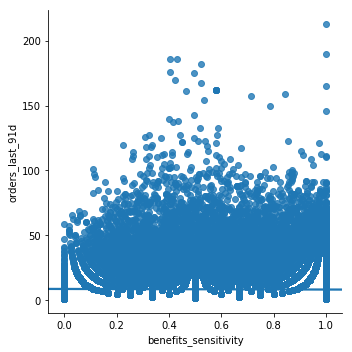

In [0]:
%matplotlib inline
import seaborn as sns

df_custseg1 = df_custseg.select('orders_last_91d', 'benefits_sensitivity')
sns.lmplot(y='orders_last_91d', x='benefits_sensitivity', data=df_custseg1.toPandas())

In [0]:
display(df_custseg.select('orders_last_91d', 'ifood_status'))

orders_last_91d,ifood_status
9.0,Inactive
15.0,Active
8.0,Inactive
4.0,Inactive
5.0,Inactive
1.0,Inactive
1.0,Inactive
5.0,Resurrected
7.0,Inactive
2.0,Inactive


In [0]:
display(df_custseg.groupby('ifood_status', 'last_nps').count())

ifood_status,last_nps,count
Active,Neutral,7857
Inactive,Neutral,2701
Resurrected,Sem Avaliacoes,15099
New,Sem Avaliacoes,3476
Churn,Promoter,7890
Resurrected,Promoter,5446
Resurrected,Detractor,629
Inactive,Promoter,12987
Resurrected,Neutral,1212
Churn,Sem Avaliacoes,16826


In [0]:
display(df_custseg.groupby('ifood_status', 'marlin_tag').count())

ifood_status,marlin_tag,count
Churn,3. Subsidy Carp,5219
Churn,2. Tilapia,9227
Churn,4. Retention Carp,9330
Resurrected,1. Marlin,1322
Inactive,2. Tilapia,12005
Active,4. Retention Carp,8644
Inactive,1. Marlin,3735
Inactive,3. Subsidy Carp,13533
Active,1. Marlin,49553
New,2. Tilapia,1401


In [0]:
display(df_custseg.select('orders_last_91d'))

orders_last_91d
9.0
15.0
8.0
4.0
5.0
1.0
1.0
5.0
7.0
2.0


In [0]:
display(df_custseg.select('qtt_orders_last_year'))

qtt_orders_last_year
32
28
8
5
11
1
15
8
8
2


In [0]:
display(df_custseg.select('qtt_valid_orders'))

qtt_valid_orders
49
39
8
7
13
2
31
8
11
2


In [0]:
display(df_custseg.select('recency_months'))

recency_months
3.06451613
0.09677419
2.19354839
2.58064516
1.83870968
3.25806452
2.70967742
0.58064516
1.74193548
2.93548387


In [0]:
display(df_custseg.select('customer_lifetime_months'))

customer_lifetime_months
19
39
4
17
12
18
22
4
12
4


In [0]:
display(df_custseg.select('days_to_reorder_at_datasource'))

days_to_reorder_at_datasource
12.222222222222221
6.466666666666668
8.142857142857142
42.0
18.6
456.0
97.0
19.6
22.75
10.25


In [0]:
display(df_custseg.select('days_to_reorder_at_concluded'))

days_to_reorder_at_concluded
12.222222222222221
6.466666666666668
8.142857142857142
42.0
18.6
456.0
97.0
19.6
21.285714285714285
41.0


In [0]:
display(df_custseg.select('recency_days'))

recency_days
94.0
3.0
67.0
79.0
56.0
100.0
83.0
18.0
53.0
90.0


In [0]:
display(df_custseg.select('freq_last_91d'))

freq_last_91d
2.97
4.95
4.21
1.32
1.65
0.33
0.33
1.65
2.31
1.46


In [0]:
display(df_custseg.select('avg_aov_last_91d'))

avg_aov_last_91d
65.78999999999999
63.85
55.3
41.62000000000001
52.18
116.4
38.0
46.06
45.88
67.39


In [0]:
display(df_custseg.select('maturity_orders'))

maturity_orders
49.0
39.0
8.0
7.0
13.0
2.0
31.0
8.0
11.0
2.0


In [0]:
display(df_custseg.select('merchant_offer'))

merchant_offer
5515.0
1062.0
945.0
429.0
730.0
729.0
573.0
439.0
1498.0
1494.0


##### marketing_push_full

######tabelas de Frequencia

In [0]:
display(df_push)

event_channel,event_name,brand,sample_type,user_id,external_user_id,event_time_utc3,platform,campaign_id,campaign_name,event_date
push,received,iFood Brasil,sample,5ac365c96ee329b1951ac7e9,6f040026ecb33d63875ca8340a55db433fe185d8e40a0111f7166063893944a8,2019-08-29T18:31:10.000Z,android,23e2e9bf-61ae-48aa-8e24-85d8f2348b21,2019-08-29 / ANDROID / 20190829MIDIAKITKAS,2019-08-29T00:00:00.000Z
push,send,iFood Brasil,sample,5ac2c99c059e9ee7e5eed43b,0753a6e30f7b58265e00becd06423d17181aa22d43f51ec34ebe9a2af0be3ab3,2019-10-10T11:31:02.000Z,ios,c3858a3b-1eea-4ab8-99ca-5b0166a9fb14,2019-10-10 / IOS / Almoço / Cidades DFN Geral,2019-10-10T00:00:00.000Z
push,received,iFood Brasil,sample,5ac36acd409f7734a97df5b9,8468bb60ea7888a33a3506e4f3d2b541afca6651bde242ed49a75da8cce67a68,2019-10-27T21:05:31.000Z,android,e5b7abaf-eafa-4a2e-bde5-62965fefa0f5,2019-10-27 / ANDROID / Ativos / Ceia - KA / CUPOM,2019-10-28T00:00:00.000Z
push,send,iFood Brasil,sample,5ac3654ad75e5a3c29fb256f,6cbda064947aec380ac7c459de0902fc0182b23dcbaa59ee7317705927f52eee,2019-10-28T11:30:49.000Z,android,2398c143-4f12-4541-afd9-06bb94cb7b8a,2019-10-28 / ANDROID / Ativos / Almoço - Light / CUPOM,2019-10-28T00:00:00.000Z
push,received,iFood Brasil,sample,5ac35d290b97ee7b6f067992,54fcbbfab48d41e79c96471d17a570f1fb2d65d1bcc1c81a8547fc1a953edb4e,2019-10-15T18:12:44.000Z,android,fe0beda0-401f-4783-9ac3-45faa723a4bc,2019-10-15 / ANDROID / Ativos / Jantar / CUPOM,2019-10-15T00:00:00.000Z
push,send,iFood Brasil,sample,5b3b5459614b1ee0f8772035,bf3eea65d3cc69a040517cfbc9783ab5015500fb61afb015143aaf128fa78611,2019-07-15T18:27:53.000Z,ios,110ab169-e1af-47c1-860f-7beea100459e,2019-07-15 / iOS / Ativos / Jantar / CUPOM / R$8,2019-07-15T00:00:00.000Z
push,received,iFood Brasil,sample,5c8ea2111668ab61c397680c,39ed72e5d00f25f46eefd5c566ef8ca352864a6f990800ad0dce219a1a150588,2019-08-18T18:19:45.000Z,ios,310dfc26-55e7-41b7-9b26-d492122bffa6,2019-08-18 / iOS / Ativos / Jantar / CUPOM,2019-08-18T00:00:00.000Z
push,send,iFood Brasil,sample,5af112133d477eece72791e2,71f0d523744e4211a3810b2d8530d68b0f75ede4e629b29a667055ab955573e0,2019-06-06T18:04:12.000Z,android,a38ea1b2-5073-4fb9-a895-35734b4e8f92,2019-06-06 / ANDROID / 20190606RECRAG,2019-06-06T00:00:00.000Z
push,received,iFood Brasil,sample,5ac368a9495e759a5f5e6670,7b0a3ea834e6dbd8352fe6950ead14e8f63579522279a616648da0daeb01bf87,2019-06-06T11:43:13.000Z,ios,0d12cf49-f9da-4716-a819-ec0aba5f43e8,2019-06-06 / IOS / Almoço - Entrega Grátis / CUPOM,2019-06-06T00:00:00.000Z
push,received,iFood Brasil,sample,5be8cf4086d18a401d3e9c8b,c8b3a0ac1bb36ab6462f73b7c7bf04da40c61b95be074ee9388b8f5788008f65,2019-11-03T18:18:22.000Z,ios,78ffbfd9-a333-4d24-a99a-0fc74ac991ef,2019-11-03 / iOS / Ativos / Jantar / CUPOM,2019-11-03T00:00:00.000Z


In [0]:
display(df_push.groupby('event_name').count().sort('event_name', ascending=True))

event_name,count
bounce,14663
click,280791
received,11658073
send,11678674


In [0]:
display(df_push.groupby('sample_type').count().sort('sample_type', ascending=True))

sample_type,count
sample,23632201


##### orders

######tabelas de Frequencia

In [0]:
display(df_orders)

order_id,order_number,order_timestamp_local,order_shift,last_status_date_local,order_total,credit,paid_amount,delivery_type,scheduled,scheduled_creation_date_local,device_app_version,device_type,device_platform,payment_method,customer_state_label,customer_city,customer_district,customer_centroid_id,customer_seg_status_last_month,customer_seg_recency_bucket,customer_seg_frequency_bucket,customer_seg_merchant_offer_bucket,customer_seg_benefits_sensitivity_bucket,customer_seg_marlin_tag,customer_seg_gross_income_bucket,frn_id,merchant_city,merchant_district,merchant_centroid_id,merchant_dish_type,distance_merchant_customer,promo_is_promotion,normal_items_quantity,promo_items_quantity,order_lag_at_login,order_lead_at_login,order_date_local,valid_order,session_id,customer_id
630e2af0-b456-4b3a-b964-4d66ce5cc5df,1290139943,2019-12-11T13:22:06.497Z,weekday lunch,2019-12-11T15:22:39.156Z,28.9,14.0,24.9,DELIVERY,false,2019-12-11T13:22:06.497Z,9.29.1,MOBILE,ANDROID,CC_ONLINE,RN,PARNAMIRIM,NOVA PARNAMIRIM,-5.89-35.2,Active,1.0,5.0,5.0,Alta,0. sem segmento,6.0,43583,NATAL,PONTA NEGRA,-5.87-35.18,Comida Brasileira,2722.6039064534743,0.0,2.0,0.0,2.0,1.0,2019-12-11T00:00:00.000Z,1,ccbcf9e2-3728-4458-a813-4031ae22e4bd,48b6d81407646ca61163f064a426ce38ac08bed2ce84f078c055c25224626b83
66f8163d-f081-4fbd-adb8-cfbbff9213f7,1141271215,2019-11-06T17:57:17.967Z,weekday dinner,2019-11-06T18:18:48.680Z,56.35,7.9,50.4,DELIVERY,false,2019-11-06T17:57:17.967Z,webapp_6.2.0,SITE,DESKTOP,CC_ONLINE,PR,LONDRINA,Gleba Fazenda Palhano,-23.33-51.19,Active,1.0,4.0,5.0,Media,1. Marlin,6.0,533415,LONDRINA,Gleba Fazenda Palhano,-23.34-51.19,Lanches,1108.8231829395027,1.0,0.0,1.0,7.0,1.0,2019-11-06T00:00:00.000Z,1,d9e94d88-ca88-4997-ad4c-62b9c0a35c1b,b3f74186880f5f9a79e0865ad8beab47e22b785b8b3bc0f14753269e336474ba
e8c55557-81d4-4159-bd2b-c144e5fbabe3,694742752,2019-06-11T20:42:32.058Z,weekday dinner,2019-06-11T22:42:54.005Z,53.8,4.0,49.8,DELIVERY,false,2019-06-11T20:42:32.058Z,iOS_iFood_9.2.1,MOBILE,IOS,CC_ONLINE,SP,SAO PAULO,Jardim Santa Cruz (sacoma),-23.64-46.59,Active,1.0,5.0,5.0,Media,1. Marlin,6.0,166370,SAO PAULO,Parque Bristol,-23.64-46.61,Comida Brasileira,1642.258522225207,0.0,2.0,0.0,5.0,1.0,2019-06-11T00:00:00.000Z,1,035b33cd-6ddf-4ee2-a887-7ba490bb9700,c4f8999d4cb83cac8134b2051ffc611d5d660c049c3744f3892d4c3abaebf690
34a60e0d-0042-49af-9aa8-4dc526a998c2,679245732,2019-06-05T19:16:42.111Z,weekday dinner,2019-06-05T21:17:13.264Z,58.9,4.0,54.9,DELIVERY,false,2019-06-05T19:16:42.111Z,iOS_iFood_9.2.1,MOBILE,IOS,CC_ONLINE,PR,LONDRINA,Centro,-23.31-51.17,Active,1.0,4.0,5.0,Media,1. Marlin,6.0,178646,LONDRINA,Centro,-23.31-51.17,Lanches,441.67750721836654,0.0,1.0,0.0,9.0,2.0,2019-06-05T00:00:00.000Z,1,93f66506-a8ba-4c22-97ea-7489131958bb,ac89a3eb35853705a09d54f1e5988ad876628b986045cd46b8fb966dee5c0290
998f6d97-f884-40ba-a7a3-e9691930a642,1052187003,2019-10-15T21:01:23.973Z,weekday dinner,2019-10-15T23:01:41.146Z,54.8,14.0,50.8,DELIVERY,false,2019-10-15T21:01:23.973Z,Android_iFood_9.22.1,MOBILE,ANDROID,CC_ONLINE,SP,SAO PAULO,Parque Panamericano,-23.45-46.73,Active,2.0,4.0,4.0,Media,1. Marlin,6.0,77662,SAO PAULO,Jardim Santo Elias,-23.48-46.74,Comida Japonesa,4398.730929643914,1.0,0.0,2.0,3.0,4.0,2019-10-15T00:00:00.000Z,1,515a402d-8b86-4e6d-9852-f02282736781,fdef6bf0530b1f6507f175167aa442ade79b6e6fa085c98bcd622750d05f1c9d
0d8b3571-be59-48c0-bb92-b7f3ce2793a0,686714753,2019-06-08T14:44:02.062Z,weekend lunch,2019-06-08T15:25:13.583Z,131.9,4.0,127.9,DELIVERY,false,2019-06-08T14:44:02.062Z,iOS_iFood_8.54.1,MOBILE,IOS,CC_ONLINE,DF,BRASILIA,Setor De Habitacoes Individuais Sul,-15.84-47.84,Active,1.0,5.0,5.0,Media,1. Marlin,6.0,180004,BRASILIA,Vila Planalto,-15.79-47.85,Doces & Bolos,5891.54625863006,0.0,18.0,0.0,2.0,3.0,2019-06-08T00:00:00.000Z,1,0260bfa3-e8e4-4b62-9500-5529600dc309,45751a4f75fbd494aa7e275932ab0791b1542ea30df8ff0713a65ca05931e900
d851b11b-39aa-4c42-9a36-2adcbace61ec,1221940598,2019-11-24T16:21:13.075Z,weekend snack,2019-11-24T16:50:50.877Z,73.7,4.0,69.7,

In [0]:
display(df_orders.groupby('order_shift').count().sort('count', ascending=False)) #variavel de comportamento do usuario, pode ser usada na segmentação.

order_shift,count
weekend dinner,153930
weekday dinner,133846
weekday lunch,103958
weekend lunch,42515
weekday snack,16540
weekend snack,9490
weekend dawn,6661
weekday dawn,4749
weekday breakfast,1093
weekend breakfast,494


In [0]:
display(df_orders.groupby('delivery_type').count().sort('count', ascending=False)) #variável pouco importante, visto que takeout representa menos de 1%

delivery_type,count
DELIVERY,471654
TAKEOUT,1622


In [0]:
display(df_orders.groupby('scheduled').count().sort('count', ascending=False)) #variável pouco importante, visto que true representa menos de 1%

scheduled,count
false,466645
true,6631


In [0]:
display(df_orders.groupby('device_type').count().sort('count', ascending=False)) #variável pouco importante, visto que site representa menos de 1%

device_type,count
MOBILE,470549
SITE,2727


In [0]:
display(df_orders.groupby('device_platform').count().sort('count', ascending=False)) #entender o comportamento de acordo com a plataforma

device_platform,count
ANDROID,266354
IOS,204510
DESKTOP,2412


In [0]:
display(df_orders.groupby('payment_method').count().sort('count', ascending=False)) #entender o comportamento de acordo com a forma de pagamento

payment_method,count
CC_ONLINE,291548
CC_OFFLINE,96917
OTHERS_OFFLINE,83805
MEAL_VOUCHER_ONLINE,1006


In [0]:
display(df_orders.groupby('customer_state_label').count().sort('count', ascending=False)) #podemos usar para fazer segmentação do usuario por UF e entender se o comportamento de uma regiao difere da outra em relação ao churn

customer_state_label,count
SP,181707
RJ,63344
MG,40252
PR,34288
DF,18673
RS,18152
CE,18122
SC,15662
PE,14123
ES,10422


In [0]:
display(df_orders.groupby('customer_state_label', 'customer_city').count().sort('customer_state_label', 'count', ascending=False)) #podemos usar para fazer segmentação do usuario por UF e entender se o comportamento de uma regiao difere da outra em relação ao churn

customer_state_label,customer_city,count
TO,PALMAS,20
SP,SAO PAULO,78522
SP,CAMPINAS,11558
SP,RIBEIRAO PRETO,7092
SP,SAO JOSE DOS CAMPOS,5689
SP,GUARULHOS,5315
SP,SANTO ANDRE,4505
SP,SANTOS,4487
SP,SAO BERNARDO DO CAMPO,3710
SP,OSASCO,3393


In [0]:
display(df_orders.groupby('customer_state_label', 'customer_city', 'customer_district').count().sort('count', ascending=False)) #podemos usar para fazer segmentação do usuario por UF e entender se o comportamento de uma regiao difere da outra em relação ao churn

customer_state_label,customer_city,customer_district,count
RJ,RIO DE JANEIRO,Barra Da Tijuca,2962
DF,BRASILIA,Asa Norte,2638
RJ,RIO DE JANEIRO,Copacabana,2313
SP,SAO PAULO,Vila Mariana,2283
PE,RECIFE,Boa Viagem,2213
SP,SAO PAULO,Bela Vista,2114
RJ,RIO DE JANEIRO,Botafogo,2080
DF,BRASILIA,Asa Sul,1843
PR,LONDRINA,Centro,1838
RJ,RIO DE JANEIRO,Campo Grande,1664


In [0]:
display(df_orders.groupby('customer_seg_status_last_month').count().sort('count', ascending=False)) #segmentação de status do cliente.

customer_seg_status_last_month,count
Active,387551
Resurrected,35266
Churn,21837
Inactive,20487
New,8135


In [0]:
display(df_orders.groupby('customer_seg_recency_bucket').count().sort('count', ascending=False)) #segmentação de status do cliente.

customer_seg_recency_bucket,count
1.0,313981
2.0,64072
3.0,49599
4.0,37219
5.0,8405


In [0]:
display(df_orders.groupby('customer_seg_frequency_bucket').count().sort('customer_seg_frequency_bucket', ascending=False)) #segmentação de status do cliente.

customer_seg_frequency_bucket,count
5.0,89121
4.0,167994
3.0,116956
2.0,64684
1.0,34521


In [0]:
display(df_orders.groupby('customer_seg_merchant_offer_bucket').count().sort('customer_seg_merchant_offer_bucket', ascending=False)) #segmentação de status do cliente.

customer_seg_merchant_offer_bucket,count
6.0,3
5.0,371651
4.0,82734
3.0,9521
2.0,8589
1.0,778


In [0]:
display(df_orders.groupby('customer_seg_benefits_sensitivity_bucket').count().sort('count', ascending=False)) #sensibilidade a beneficios, importante para analise do churn.

customer_seg_benefits_sensitivity_bucket,count
Alta,249042
Media,149336
Baixa,74898


In [0]:
display(df_orders.groupby('customer_seg_marlin_tag').count().sort('customer_seg_marlin_tag', ascending=False)) #segmentação por marlin tag.

customer_seg_marlin_tag,count
4. Retention Carp,51007
3. Subsidy Carp,60207
2. Tilapia,97382
1. Marlin,213580
0. sem segmento,51100


In [0]:
display(df_orders.groupby('promo_is_promotion').count().sort('count', ascending=False)) #compras com ou sem promo

promo_is_promotion,count
0.0,320062
1.0,153214


###### Resumo das estatisticas Básicas + Matriz de Correlação

In [0]:
display(df_orders['order_total', 'credit', 'paid_amount', 'distance_merchant_customer', 'normal_items_quantity', 'promo_items_quantity', 'order_lag_at_login', 'order_lead_at_login'].summary())

summary,order_total,credit,paid_amount,distance_merchant_customer,normal_items_quantity,promo_items_quantity,order_lag_at_login,order_lead_at_login
count,473276,473276,473276,473276,473276,473276,473276,473276
mean,55.83872026041026,6.247960830464676,50.38546833133147,2780.8518226264214,1.5808534554889748,0.473732029513434,10.695761035843779,9.451214513307246
stddev,31.537253088944993,4.404274579267232,32.266961461462536,50808.25051717624,2.148584050178147,1.3667500803887596,29.152389721906122,17.24824037953316
min,13.05,4.0,9.0,0.0,0.0,0.0,0.0,0.0
25%,35.9,4.0,30.0,985.7589345186192,1.0,0.0,1.0,1.0
50%,47.7,4.0,42.7,1894.2016135339857,1.0,0.0,4.0,4.0
75%,66.0,4.0,61.7,3142.407747495041,2.0,1.0,10.0,10.0
max,1641.0,84.0,1637.0,1.1974527883558273E7,233.0,105.0,2612.0,247.0


In [0]:
campos_corr = ['order_total', 'credit', 'paid_amount', 'distance_merchant_customer', 'normal_items_quantity', 'promo_items_quantity', 'order_lag_at_login', 'order_lead_at_login']
df_corr = df_orders.select(campos_corr).dropna()
display(correlacao(df_corr, campos_corr))

order_total,credit,paid_amount,distance_merchant_customer,normal_items_quantity,promo_items_quantity,order_lag_at_login,order_lead_at_login
1.0,-0.17215917079136442,0.9939797466597283,0.00567210203365115,0.3006027797867277,0.008058828925631246,0.016551066979313665,0.026221352494709076
-0.17215917079136442,1.0,-0.2566021247768886,-0.0014730329316027416,-0.09325544272599459,0.04125618435923584,-0.019234948182061347,-0.02969037983927421
0.9939797466597283,-0.2566021247768886,1.0,0.005754646446969714,0.302918538949185,0.00405558859133335,0.01711969665625636,0.027858515042362673
0.00567210203365115,-0.0014730329316027416,0.005754646446969714,1.0,0.0018496094714555555,-9.160058006860492E-4,0.0013845711548381486,0.0016183455601928042
0.3006027797867277,-0.09325544272599459,0.302918538949185,0.0018496094714555555,1.0,-0.13177916678399113,7.291980006895599E-4,0.0077548026716344086
0.008058828925631246,0.04125618435923584,0.00405558859133335,-9.160058006860492E-4,-0.13177916678399113,1.0,0.006656837135985659,0.006072689193121009
0.016551066979313665,-0.019234948182061347,0.01711969665625636,0.0013845711548381486,7.291980006895599E-4,0.006656837135985659,1.0,0.21597359209957537
0.026221352494709076,-0.02969037983927421,0.027858515042362673,0.0016183455601928042,0.0077548026716344086,0.006072689193121009,0.21597359209957537,1.0


###### Contagem de Outliers

In [0]:
#coluna 'order_total'
col = 'order_total'
n = df_orders.select(col).count()
print('total de dados em', col, '=', n )
desvpad(df_orders, col)

total de dados em order_total = 473276
contagem sem outlier de order_total = 464798

In [0]:
#coluna 'credit'
col = 'credit'
n = df_orders.select(col).count()
print('total de dados em', col, '=', n )
desvpad(df_orders, col)

total de dados em credit = 473276
contagem sem outlier de credit = 468495

In [0]:
#coluna 'paid_amount'
col = 'paid_amount'
n = df_orders.select(col).count()
print('total de dados em', col, '=', n )
desvpad(df_orders, col)

total de dados em paid_amount = 473276
contagem sem outlier de paid_amount = 465068

In [0]:
#coluna 'distance_merchant_customer'
col = 'distance_merchant_customer'
n = df_orders.select(col).count()
print('total de dados em', col, '=', n )
desvpad(df_orders, col)

total de dados em distance_merchant_customer = 473276
contagem sem outlier de distance_merchant_customer = 473186

In [0]:
#coluna 'normal_items_quantity'
col = 'normal_items_quantity'
n = df_orders.select(col).count()
print('total de dados em', col, '=', n )
desvpad(df_orders, col)

total de dados em normal_items_quantity = 473276
contagem sem outlier de normal_items_quantity = 466861

In [0]:
#coluna 'promo_items_quantity'
col = 'promo_items_quantity'
n = df_orders.select(col).count()
print('total de dados em', col, '=', n )
desvpad(df_orders, col)

total de dados em promo_items_quantity = 473276
contagem sem outlier de promo_items_quantity = 469926

In [0]:
#coluna 'order_lag_at_login'
col = 'order_lag_at_login'
n = df_orders.select(col).count()
print('total de dados em', col, '=', n )
desvpad(df_orders, col)

total de dados em order_lag_at_login = 473276
contagem sem outlier de order_lag_at_login = 467716

In [0]:
#coluna 'order_lead_at_login'
col = 'order_lead_at_login'
n = df_orders.select(col).count()
print('total de dados em', col, '=', n )
desvpad(df_orders, col)

total de dados em order_lead_at_login = 473276
contagem sem outlier de order_lead_at_login = 463326

###### Gráficos e Boxplots

In [0]:
display(df_orders.select('order_total'))

order_total
28.9
56.35
53.8
58.9
54.8
131.9
73.7
84.81
43.98
85.7


In [0]:
display(df_orders.select('credit'))

credit
14.0
7.9
4.0
4.0
14.0
4.0
4.0
13.9
4.0
4.0


In [0]:
display(df_orders.select('paid_amount'))

paid_amount
24.9
50.4
49.8
54.9
50.8
127.9
69.7
80.81
39.98
81.7


In [0]:
display(df_orders.select('distance_merchant_customer'))

distance_merchant_customer
2722.6039064534743
1108.8231829395027
1642.258522225207
441.67750721836654
4398.730929643914
5891.54625863006
732.4961580864333
1836.1006450371312
763.9138135742279
569.327804094881


In [0]:
display(df_orders.select('normal_items_quantity'))

normal_items_quantity
2.0
0.0
2.0
1.0
0.0
18.0
2.0
2.0
1.0
3.0


In [0]:
display(df_orders.select('normal_items_quantity'))

normal_items_quantity
2.0
0.0
2.0
1.0
0.0
18.0
2.0
2.0
1.0
3.0


In [0]:
display(df_orders.select('promo_items_quantity'))

promo_items_quantity
0.0
1.0
0.0
0.0
2.0
0.0
0.0
1.0
0.0
0.0


In [0]:
display(df_orders.select('order_lag_at_login'))

order_lag_at_login
2.0
7.0
5.0
9.0
3.0
2.0
0.0
3.0
2.0
50.0


In [0]:
display(df_orders.select('order_lead_at_login'))

order_lead_at_login
1.0
1.0
1.0
2.0
4.0
3.0
1.0
1.0
13.0
7.0


#####orders_with_cost_revenue

######tabelas de Frequencia

In [0]:
display(df_ordersrev)

customer_id,order_number,cohort_month,first_order_date,months_after_first_purchase,frn_id,general_net_profit,order_date_local
6f3c60616e53fc2a1ce1f1337db4fdada2fe125a78f078d44d7c10bee06341ae,1336368276,2017-04-01T00:00:00.000Z,2017-04-22T00:00:00.000Z,32.0,152742,9.88835,2019-12-21
972fcfa3faf5e69ec3db3a3b849bf5a49cdff7e96beb9cf73266c8736943395f,1336339799,2017-04-01T00:00:00.000Z,2017-04-01T00:00:00.000Z,32.0,244093,14.421525,2019-12-21
e6ae69a4ae76eac5559ce4d7cb9b0a7b24dacfaf3bcc361a41f28a2c294f6667,1335963824,2015-08-01T00:00:00.000Z,2015-08-23T00:00:00.000Z,52.0,9413,8.266,2019-12-21
e55f07332ad25dda4035d35587caf066944f61a08aa820543ec12c15be492e49,1336099696,2017-02-01T00:00:00.000Z,2017-02-05T00:00:00.000Z,34.0,316174,14.194774999999995,2019-12-21
e65bc48d9b36aecf456236e307f3332196a18061679e915397f4f01a8f121ba4,1336155006,2014-05-01T00:00:00.000Z,2014-05-25T00:00:00.000Z,67.0,14531,10.8003125,2019-12-21
fc33c74ba5463c285e0145b754dee7152d4f0b5d0c12ff073f6cf05ac57e0fdb,1203276292,2017-11-01T00:00:00.000Z,2017-11-17T00:00:00.000Z,24.0,156235,10.05875,2019-11-20
36dbaa780b6338afde2fd816c3384abe97b777f40fc8bab82215875d057efc29,1203855943,2017-08-01T00:00:00.000Z,2017-08-26T00:00:00.000Z,27.0,20548,7.37470625,2019-11-20
71ebd871875b042ae1c4fe1877a4dab624f560a5c2d69b4ac087c18f436b9226,1204126271,2018-11-01T00:00:00.000Z,2018-11-18T00:00:00.000Z,12.0,49579,11.16635,2019-11-20
9322119a3ceca921f493039c5b3eb394bf543a6c1dd6cc6d32d6cf12650e117c,1202997687,2017-08-01T00:00:00.000Z,2017-08-26T00:00:00.000Z,27.0,207566,13.1570125,2019-11-20
26cb22182928f0ab13696a73ae7cf3e4b9dd0676037314b4c9dba45ae37f7867,1203496656,2017-07-01T00:00:00.000Z,2017-07-27T00:00:00.000Z,28.0,267333,10.8575,2019-11-20


In [0]:
display(df_ordersrev.groupby('cohort_month').count().sort('count', ascending=False))

cohort_month,count
2019-06-01T00:00:00.000Z,29445
2019-05-01T00:00:00.000Z,17806
2019-04-01T00:00:00.000Z,16336
2019-03-01T00:00:00.000Z,16052
2019-01-01T00:00:00.000Z,15503
2018-11-01T00:00:00.000Z,15296
2018-12-01T00:00:00.000Z,14906
2018-10-01T00:00:00.000Z,14107
2019-02-01T00:00:00.000Z,13102
2018-09-01T00:00:00.000Z,11868


###### Resumo das estatisticas Básicas + Matriz de Correlação

In [0]:
display(df_ordersrev['months_after_first_purchase', 'general_net_profit'].summary())

summary,months_after_first_purchase,general_net_profit
count,492138,492138
mean,24.335806216955408,7.395985463685713
stddev,17.93781199771546,6.812422942900049
min,0.0,-1994.034375
25%,9.0,6.081299999999999
50%,21.0,7.9758125
75%,36.0,10.1675111177623
max,95.0,178.382


In [0]:
campos_corr = ['months_after_first_purchase', 'general_net_profit']
df_corr = df_ordersrev.select(campos_corr).dropna()
display(correlacao(df_corr, campos_corr))

months_after_first_purchase,general_net_profit
1.0,0.13064300821339297
0.13064300821339297,1.0


###### Contagem de Outliers

In [0]:
#coluna 'months_after_first_purchase'
col = 'months_after_first_purchase'
n = df_ordersrev.select(col).count()
print('total de dados em', col, '=', n )
desvpad(df_ordersrev, col)

total de dados em months_after_first_purchase = 492138
contagem sem outlier de months_after_first_purchase = 487817

In [0]:
#coluna 'general_net_profit'
col = 'general_net_profit'
n = df_ordersrev.select(col).count()
print('total de dados em', col, '=', n )
desvpad(df_ordersrev, col)

total de dados em general_net_profit = 492138
contagem sem outlier de general_net_profit = 486969

###### Gráficos e Boxplots

In [0]:
display(df_ordersrev.select('months_after_first_purchase'))

months_after_first_purchase
32.0
32.0
52.0
34.0
67.0
24.0
27.0
12.0
27.0
28.0


In [0]:
display(df_ordersrev.select('general_net_profit'))

general_net_profit
9.88835
14.421525
8.266
14.194774999999995
10.8003125
10.05875
7.37470625
11.16635
13.1570125
10.8575


#####sessions_visits

######tabelas de Frequencia

In [0]:
display(df_visits)

session_id,dau,platform,user_identifier,user_account_uuid,session_started_at_amsp,session_ended_at_amsp,session_started_at_utc0,session_ended_at_utc0,session_duration_seconds,device_model,device_manufacturer,sum_event_open,sum_view_restaurant_screen,sum_view_dish_screen,sum_click_add_item,sum_view_checkout,sum_callback_purchase,order_session_quantity,first_order_origin_feature
41162808-5335-4e4f-aa52-45754ec1d558,2019-11-04_661ead80-50a2-48b4-ae78-f872e2f08c11,IOS,ffa840ebe8b397e995245525ec98f0b31a882c4d3e47dc0e91d3115cd20d6d80,ca438b60-3d04-44c0-9883-c4f01fc512ad,2019-11-04T09:14:47.566Z,2019-11-04T09:15:50.323Z,2019-11-04T11:14:47.566Z,2019-11-04T11:15:50.323Z,63.0,"iPhone9,3",Apple,1.0,9.0,1.0,1.0,1.0,1.0,1.0,Loop
52f0a543-fcc7-4ff0-bed1-41bec8a51374,2019-12-07_17ae6c54-37e1-42e3-b82b-e562aaeb7730,IOS,a59ea42fbbaf0fa9a48b65f45842d9d061d23775ad2af61c28d1235b5510ae68,414f1e51-e872-42ca-ad5e-c30b085bd5e4,2019-12-07T13:28:37.764Z,2019-12-07T15:04:00.819Z,2019-12-07T15:28:37.764Z,2019-12-07T17:04:00.819Z,5723.0,"iPhone9,3",Apple,17.0,12.0,3.0,1.0,2.0,1.0,1.0,Last Restaurants
f06f2a6d-14cc-44e3-8ec6-66191659430b,2019-12-29_d8a7f51d-4394-3c9a-ae62-8522f5885d3f,ANDROID,e7dcbc11f83b22ea57ec8b385b9fa38d48532b180e3d19cbde6d4766687a48b9,5c697207-d8a4-460e-b171-3e94e42be5ab,2019-12-29T19:58:38.297Z,2019-12-29T20:17:45.199Z,2019-12-29T22:58:38.297Z,2019-12-29T23:17:45.199Z,1147.0,Redmi Note 8,Xiaomi,2.0,4.0,7.0,7.0,5.0,1.0,1.0,Ranking
716d0044-0d76-4199-86ca-62930a751d59,2019-12-03_9675dcd9-9dd5-3ec3-809e-9006b4fac160,ANDROID,2959b13e1caef84fa6cde74693ba2476f17eaa72b66dad051b74924762da14c7,615b2fb5-e76d-4fa7-b982-9564650c76c5,2019-12-03T14:54:14.621Z,2019-12-03T16:31:47.527Z,2019-12-03T16:54:14.621Z,2019-12-03T18:31:47.527Z,5853.0,SM-A520F,samsung,11.0,1.0,1.0,1.0,3.0,1.0,1.0,Taxa na faixa
96081494-8554-4c3f-92b6-94e2070d1660,2019-12-20_e953c804-ecd2-3f00-8465-0ba2d8ce5aa1,ANDROID,9c944018e8b8cd2ac2fec6edf1f46c3c452c4e70c46e39a89cc37430edf01ad7,ba8596c4-9fbf-4f67-9e2a-dbb65f4b7c40,2019-12-20T20:28:22.584Z,2019-12-20T20:54:25.376Z,2019-12-20T23:28:22.584Z,2019-12-20T23:54:25.376Z,1563.0,SM-J710MN,samsung,4.0,4.0,9.0,2.0,2.0,1.0,1.0,CRM Restaurant
85091579-c5e8-474c-9b77-7129564141d9,2019-08-09_37124edd-a771-41bc-95bd-e0d607863f6d,ANDROID,c447b075-5080-4ea9-99eb-1119973e9e08,c447b075-5080-4ea9-99eb-1119973e9e08,2019-08-09T20:25:25.025Z,2019-08-09T21:22:41.041Z,2019-08-09T23:25:25.025Z,2019-08-10T00:22:41.041Z,3436.0,Moto G Play,motorola,5.0,2.0,24.0,4.0,5.0,1.0,1.0,Lanches
2284b979-27c9-4ad2-8d12-557ad537200e,2019-12-14_aa7ca448-de7d-4f24-9003-030ad0142522,IOS,0b51610a7974ad8751637867fa168e3b112df6feda0e01ca493977128741eaea,76cb1602-6a45-431a-a2af-2a63bad6f038,2019-12-14T21:46:56.353Z,2019-12-14T21:54:19.136Z,2019-12-15T00:46:56.353Z,2019-12-15T00:54:19.136Z,443.0,"iPhone7,2",Apple,2.0,5.0,2.0,1.0,1.0,1.0,1.0,Ranking
e969590a-382e-41fc-b7c5-9980984d40f4,2019-12-06_3e0c8796-3451-4f93-954a-7562098407ea,IOS,cc37994f00b79a48ae57678a6d192c454c74b52f6839e7e6bb693ab1e8b67a03,b00996d7-3fa3-4c21-aaaf-3a52cc231e37,2019-12-06T13:07:41.512Z,2019-12-06T13:11:25.127Z,2019-12-06T15:07:41.512Z,2019-12-06T15:11:25.127Z,224.0,"iPhone10,6",Apple,3.0,4.0,2.0,1.0,1.0,1.0,1.0,Last Restaurants
83a6e98e-ecbc-440e-81b2-b03ab719e190,2019-06-02_6de65a8d-eead-477f-9542-7de7d82a149b,IOS,228ebd5d-1099-4c27-8304-382541861e81,228ebd5d-1099-4c27-8304-382541861e81,2019-06-02T22:48:40.566Z,2019-06-02T23:26:59.356Z,2019-06-03T01:48:40.566Z,2019-06-03T02:26:59.356Z,2299.0,"iPhone11,8",Apple,9.0,9.0,4.0,4.0,3.0,1.0,1.0,Featured Restaurant
0de892ef-e99e-406f-9959-8b12da2b3bbc,2019-10-01_11c0c641-8c7f-38ee-9c96-26499acdef34,ANDROID,2c64e0bbf845290318ac4816a9a4c547edb326a4e777e0c262d4c3c76c4d3d03,5bf6ae78-249e-4836-9727-3dba86dbc067,2019-10-01T23:19:27.027Z,2019-10-01T23:53:43.043Z,2019-10-02T02:19:27.027Z,2019-10-02T02:53:43.043Z,2056.0,Moto G (5S),motorola,9.0,13.0,20.0,6.0,12.0,1.0,1.0,Last Restaurants


In [0]:
display(df_visits.groupby('platform').count().sort('count', ascending=False)) #acessos por qual dispositivo? O Comportamento difere por serem dispositivos diferentes?

platform,count
ANDROID,253117
IOS,181641


In [0]:
display(df_visits.groupby('first_order_origin_feature').count().sort('count', ascending=False)) #de onde veio o pedido? O Comportamento difere entre os dispositivos?

first_order_origin_feature,count
Featured Restaurant,114787
Last Restaurants,67271
Ranking,63607
Filter,19021
Lanches,17185
Pizza,14194
CRM Restaurant,12199
Taxa na faixa,9321
Order Details,8703
Brasileira,7731


###### Resumo das estatisticas Básicas + Matriz de Correlação

In [0]:
display(df_visits[['session_duration_seconds', 'sum_event_open', 'sum_view_restaurant_screen', 'sum_view_dish_screen', 'sum_click_add_item', 'sum_view_checkout', 'sum_callback_purchase', 'order_session_quantity']].summary())

summary,session_duration_seconds,sum_event_open,sum_view_restaurant_screen,sum_view_dish_screen,sum_click_add_item,sum_view_checkout,sum_callback_purchase,order_session_quantity
count,434758,434758,434758,434758,434758,434758,434758,434758
mean,2694.4370569374228,6.149938586523997,8.870527971883208,5.745311184613049,2.93483501166166,4.265616733907139,1.249897644206662,1.1503457095671614
stddev,21144.496517631316,6.3165359194578485,13.47225331143635,6.810784349860057,3.9664831195479,6.606854142453227,2.2780753874887507,2.101089780483327
min,-47.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0
25%,678.0,2.0,2.0,2.0,1.0,1.0,1.0,1.0
50%,1806.0,4.0,5.0,4.0,2.0,3.0,1.0,1.0
75%,3171.0,8.0,10.0,7.0,3.0,5.0,1.0,1.0
max,2575751.0,631.0,1086.0,409.0,708.0,800.0,359.0,311.0


In [0]:
campos_corr = ['session_duration_seconds', 'sum_event_open', 'sum_view_restaurant_screen', 'sum_view_dish_screen', 'sum_click_add_item', 
               'sum_view_checkout', 'sum_callback_purchase', 'order_session_quantity']
df_corr = df_visits.select(campos_corr).dropna() #missings tratados anteriormente
display(correlacao(df_corr, campos_corr))

session_duration_seconds,sum_event_open,sum_view_restaurant_screen,sum_view_dish_screen,sum_click_add_item,sum_view_checkout,sum_callback_purchase,order_session_quantity
1.0,0.0640846499058526,0.017298723176926694,0.033155014532461294,0.020393882796420487,0.0298582094471788,0.010402585697961701,0.007982378449912182
0.0640846499058526,1.0,0.23254131630708338,0.3123692948359937,0.26741545072997874,0.34477535837685036,0.26223187537152426,0.2342568451763697
0.017298723176926694,0.23254131630708338,1.0,0.5445467196018765,0.39559041220725705,0.20719469030248425,0.2684333884020645,0.27289862711995494
0.033155014532461294,0.3123692948359937,0.5445467196018765,1.0,0.6119240195049845,0.537239593513477,0.34064784786373964,0.32873976053337967
0.020393882796420487,0.26741545072997874,0.39559041220725705,0.6119240195049845,1.0,0.7266581357778001,0.6585540037073871,0.6602745296843033
0.0298582094471788,0.34477535837685036,0.20719469030248425,0.537239593513477,0.7266581357778001,1.0,0.7021302982451361,0.664121542018653
0.010402585697961701,0.26223187537152426,0.2684333884020645,0.34064784786373964,0.6585540037073871,0.7021302982451361,1.0,0.910688861973609
0.007982378449912182,0.2342568451763697,0.27289862711995494,0.32873976053337967,0.6602745296843033,0.664121542018653,0.910688861973609,1.0


###### Contagem de Outliers

In [0]:
#coluna 'session_duration_seconds'
col = 'session_duration_seconds'
n = df_visits.select(col).count()
print('total de dados em', col, '=', n )
desvpad(df_visits, col)

total de dados em session_duration_seconds = 434758
contagem sem outlier de session_duration_seconds = 434206

In [0]:
#coluna 'sum_event_open'
col = 'sum_event_open'
n = df_visits.select(col).count()
print('total de dados em', col, '=', n )
desvpad(df_visits, col)

total de dados em sum_event_open = 434758
contagem sem outlier de sum_event_open = 428547

In [0]:
#coluna 'sum_view_restaurant_screen'
col = 'sum_view_restaurant_screen'
n = df_visits.select(col).count()
print('total de dados em', col, '=', n )
desvpad(df_visits, col)

total de dados em sum_view_restaurant_screen = 434758
contagem sem outlier de sum_view_restaurant_screen = 427889

In [0]:
#coluna 'sum_view_dish_screen'
col = 'sum_view_dish_screen'
n = df_visits.select(col).count()
print('total de dados em', col, '=', n )
desvpad(df_visits, col)

total de dados em sum_view_dish_screen = 434758
contagem sem outlier de sum_view_dish_screen = 427595

In [0]:
#coluna 'sum_click_add_item'
col = 'sum_click_add_item'
n = df_visits.select(col).count()
print('total de dados em', col, '=', n )
desvpad(df_visits, col)

total de dados em sum_click_add_item = 434758
contagem sem outlier de sum_click_add_item = 430957

In [0]:
#coluna 'sum_view_checkout'
col = 'sum_view_checkout'
n = df_visits.select(col).count()
print('total de dados em', col, '=', n )
desvpad(df_visits, col)

total de dados em sum_view_checkout = 434758
contagem sem outlier de sum_view_checkout = 430995

In [0]:
#coluna 'sum_callback_purchase'
col = 'sum_callback_purchase'
n = df_visits.select(col).count()
print('total de dados em', col, '=', n )
desvpad(df_visits, col)

total de dados em sum_callback_purchase = 434758
contagem sem outlier de sum_callback_purchase = 433429

In [0]:
#coluna 'order_session_quantity'
col = 'order_session_quantity'
n = df_visits.select(col).count()
print('total de dados em', col, '=', n )
desvpad(df_visits, col)

total de dados em order_session_quantity = 434758
contagem sem outlier de order_session_quantity = 434227

###### Gráficos e Boxplots

In [0]:
display(df_visits.select('session_duration_seconds'))

session_duration_seconds
63.0
5723.0
1147.0
5853.0
1563.0
3436.0
443.0
224.0
2299.0
2056.0


In [0]:
display(df_visits.select('sum_event_open'))

sum_event_open
1.0
17.0
2.0
11.0
4.0
5.0
2.0
3.0
9.0
9.0


In [0]:
display(df_visits.select('sum_view_restaurant_screen'))

sum_view_restaurant_screen
9.0
12.0
4.0
1.0
4.0
2.0
5.0
4.0
9.0
13.0


In [0]:
display(df_visits.select('sum_view_dish_screen'))

sum_view_dish_screen
1.0
3.0
7.0
1.0
9.0
24.0
2.0
2.0
4.0
20.0


In [0]:
display(df_visits.select('sum_click_add_item'))

sum_click_add_item
1.0
1.0
7.0
1.0
2.0
4.0
1.0
1.0
4.0
6.0


In [0]:
display(df_visits.select('sum_view_checkout'))

sum_view_checkout
1.0
2.0
5.0
3.0
2.0
5.0
1.0
1.0
3.0
12.0


In [0]:
display(df_visits.select('sum_callback_purchase'))

sum_callback_purchase
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0


In [0]:
display(df_visits.select('order_session_quantity'))

order_session_quantity
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0


##1.2 Analise Exploratoria de Dados - Problema 01: O que fizeram os clientes darem Churn?

In [0]:
dfaed = spark.read.parquet('/dbfs/FileStore/ifood/refinado/df_analise')
display(dfaed)

cust_seg,segmentation_month,ifood_status_last_month,ifood_status,last_nps,marlin_tag,recency_days,benefits_sensitivity,merchant_offer,merchant_variety,order_count,push_count,visits_count,sent_count,rec_count,click_count,bounce_count,churn_status,last_status
201906_01f66d3857324ae4400c855ecae7ea5c8de28ed160701767f157d73a45e45949,2019-06-01,Active,Active,0,3,1.0,1.0,280.0,0.3333333333333333,1,17,0,8,8,1,0,1,1
201906_078c039cf735139a5e22eebcc9716ef7985c197ab28d75522fe943278e348239,2019-06-01,Inactive,Resurrected,0,4,0.0,1.0,1054.0,1.0,0,38,0,19,19,0,0,1,2
201906_084af45567956b3210b7581ba99b9fad1cd71324c99fba4d5c27f582c5905597,2019-06-01,Active,Active,2,1,0.0,0.1,2371.0,0.55,6,36,0,18,16,0,2,1,1
201906_13631c8914c28e212c0507cff6f8e072a8f8a19837703417454a26d817f095d1,2019-06-01,Active,Active,1,2,7.0,0.8,2794.0,1.0,1,456,0,226,226,4,0,1,1
201906_13ce6b4cbe394ee726c5070fd97e709666423669d826c95318a7143f63365c21,2019-06-01,Inactive,New,3,2,28.0,0.0,228.0,1.0,0,2,0,1,0,0,1,1,2
201906_17fdb9d3128dd6588bcec5fc83b1dbc4cf55451dc8f3fbb966eabdcfdeb6cdfe,2019-06-01,Inactive,Resurrected,2,4,1.0,1.0,6821.0,0.3333333333333333,6,212,0,106,106,0,0,1,2
201906_1a99c26eb9c8deae6de8d07cf20ad02a614d310212252f5b1cde455aa963989d,2019-06-01,Active,Active,1,4,0.0,1.0,6053.0,0.9,3,172,0,86,86,0,0,1,1
201906_1b56aa788f41327b2df2a3c0bd87254c9831ebc6426208d6675fb60e72d2a284,2019-06-01,Active,Active,1,4,8.0,0.7142857142857143,554.0,0.5,3,114,0,50,50,14,0,1,1
201906_1b9aaf1c0173a20c980d5dd44e38cd976d3a72ca62c5a87d3771fe8bb82bd417,2019-06-01,Inactive,New,0,4,14.0,0.0,2150.0,1.0,0,59,0,29,29,1,0,1,2
201906_1d5672eadd6c02d292925acab0700dc3637434433b39c6e5fbd9720fdedf9a40,2019-06-01,Active,Active,1,1,7.0,0.10526315789473684,1800.0,0.21052631578947367,5,157,0,76,76,5,0,1,1


In [0]:
display(dfaed.select('ifood_status', 'recency_days'))

ifood_status,recency_days
Active,1.0
Resurrected,0.0
Active,0.0
Active,7.0
New,28.0
Resurrected,1.0
Active,0.0
Active,8.0
New,14.0
Active,7.0


In [0]:
dfp1 = dfaed.select('churn_status', 'order_count', 'visits_count', 'push_count', 'sent_count' , 'rec_count', 'click_count', 'benefits_sensitivity')
display(dfp1)

churn_status,order_count,visits_count,push_count,sent_count,rec_count,click_count,benefits_sensitivity
1,1,0,17,8,8,1,1.0
1,0,0,38,19,19,0,1.0
1,6,0,36,18,16,0,0.1
1,1,0,456,226,226,4,0.8
1,0,0,2,1,0,0,0.0
1,6,0,212,106,106,0,1.0
1,3,0,172,86,86,0,1.0
1,3,0,114,50,50,14,0.7142857142857143
1,0,0,59,29,29,1,0.0
1,5,0,157,76,76,5,0.10526315789473684


In [0]:
display(dfp1.groupby('churn_status').mean('push_count'))

churn_status,avg(push_count)
0,107.9748600285432
1,136.7623120768142


In [0]:
display(dfp1.groupby('churn_status').mean('sent_count','rec_count','click_count')) 

churn_status,avg(sent_count),avg(rec_count),avg(click_count)
0,53.59728473670729,53.485088008197025,0.8066381234676328
1,67.46739604452776,67.35583183504839,1.862101679354271


In [0]:
display(dfp1.groupby('churn_status').mean('benefits_sensitivity')) 

churn_status,avg(benefits_sensitivity)
0,0.6574206670733571
1,0.6477042607784333


In [0]:
display(dfp1.groupby('churn_status').mean('order_count')) 

churn_status,avg(order_count)
0,0.027518571376294508
1,3.6128227688305725


In [0]:
display(dfp1.groupby('churn_status').mean('visits_count')) 

churn_status,avg(visits_count)
0,0.005781827496615069
1,0.5779044412991087


#### Problema 01: O que fizeram os clientes darem Churn?

###### Com base nas análises exploratorias, identificamos que a evasão de clientes pode ser causada principalmente por uma particularidade dos clientes em relação a quantidade de pushs enviados no aplicativo.
###### Ao fazermos a união dos dados da base customer_segmentation com a base de push, vemos que o numero de envios para os clientes que evadiram é certa de Com base na análise exploratoria, identificamos que a evasão de clientes pode ser causada principalmente por uma particularidade dos cem relação a quantidade de pushs enviados no aplicativo. 

###### Apesar de o número de envios ser 15% menor em relação aos clientes que continuam na plataforma, o numero de clicks é a metade. Com esse ponto em mente, presumimos que a maior parte destes clientes bloquearam as notificações do aplicativo. Vale ressaltar que a sensibilidade a beneficios é bem parecida entre os dois grupos, mas o numero de visitas e compras no app diferente bastante, reforçando a tese do bloqueio da mensageria, pois estes clientes são também menos suscetíveis a acessar o app.

##1.3 Analise Exploratoria de Dados - Problema 02: Qual a importância dos eventos (push, compra, acesso, entre outros) ao longo da vida do cliente?

In [0]:
dfco = spark.read.parquet('/dbfs/FileStore/ifood/refinado/df_custseg_orders')

dfcp = spark.read.parquet('/dbfs/FileStore/ifood/refinado/df_custseg_push')

nulo = 0
dfcev = df_custseg_push.withColumn("sent", F.when(F.col("event_name")=='send', 1).otherwise(nulo))
dfcev = dfcev.withColumn("received", F.when(F.col("event_name")=='received', 1).otherwise(nulo))
dfcev = dfcev.withColumn("clicked", F.when(F.col("event_name")=='click', 1).otherwise(nulo))
dfcev = dfcev.withColumn("bounce", F.when(F.col("event_name")=='bounce', 1).otherwise(nulo))
#dfcev = df.drop(col('event_seg'))
dfcev = df.fillna(nulo, subset=['sent_count'])
dfcev = df.fillna(nulo, subset=['rec_count'])
dfcev = df.fillna(nulo, subset=['click_count'])
dfcev = df.fillna(nulo, subset=['bounce_count'])

dfcv = spark.read.parquet('/dbfs/FileStore/ifood/refinado/df_custseg_visits')

In [0]:
display(dfcev)

cust_seg,segmentation_month,ifood_status_last_month,ifood_status,last_nps,marlin_tag,recency_days,benefits_sensitivity,merchant_offer,merchant_variety,order_count,push_count,visits_count,sent_count,rec_count,click_count,bounce_count,churn_status,last_status
201906_00c897bee349cf118e930e642b6f9a57ee8423847cdac4bd79cf78625537370a,2019-06-01,Inactive,Resurrected,0,4,27.0,0.0,3203.0,1.0,2,0,0,0,0,0,0,1,2
201906_00d5a56c288eaf9129d0958ac61baa7a8ae254ff2ecc9b54043e70c8f48b8e9d,2019-06-01,Inactive,New,1,3,4.0,1.0,821.0,1.0,0,94,0,47,47,0,0,1,2
201906_0249a1816bc42e67f110b94788eef6e9645a81bdd662ae779bb25cb115820fc5,2019-06-01,Active,Active,1,1,11.0,0.5,98.0,0.8333333333333334,2,0,0,0,0,0,0,1,1
201906_03057ac8728a6d7ece23c6db71441290527e647294bbf82876f91b82d2a96c1a,2019-06-01,Inactive,Resurrected,0,4,1.0,0.5,3082.0,1.0,2,48,0,24,24,0,0,1,2
201906_047f0099a3faaa9892f023739f9810f9726a401d9ee6d4658a31be9a413b36da,2019-06-01,Inactive,Resurrected,0,4,6.0,0.6666666666666666,1518.0,1.0,3,27,0,13,13,1,0,1,2
201906_04ec9f05122e034346e3f2bb7aa5d60c2db846af5065fc981263a671d8207365,2019-06-01,Resurrected,Active,1,3,0.0,1.0,2015.0,0.6,4,110,0,54,54,2,0,1,null
201906_07f3844479cf7203757ab94a4984e3c4cf3ec56fbebf1321f89aab131614475c,2019-06-01,Active,Active,0,1,0.0,0.8333333333333334,1401.0,0.20833333333333331,3,426,0,212,212,2,0,1,1
201906_0809328f27ce4fbc7631d7667ae0dbe527b427288d10a19a451eaa47a084b2f3,2019-06-01,Inactive,Resurrected,2,4,8.0,0.5,1052.0,1.0,1,16,0,8,8,0,0,1,2
201906_0839fe1ad1e5e4d9b3260584db99c3a7d0e89ccdbe52ddfa3abe72b79fe1b342,2019-06-01,Active,Churn,1,4,31.0,0.7894736842105263,1992.0,0.6842105263157895,1,668,0,333,333,2,0,0,1
201906_0cd2ce0d36d56d7a40b908145136168ea472ce210bfaacb6961d5c5c3dc68778,2019-06-01,Active,Active,0,4,11.0,0.5,2353.0,1.0,1,56,0,28,28,0,0,1,1


In [0]:
display(dfcp.groupby('event_name').count()) 

event_name,count
received,11659927
null,40402
click,280491
send,11680520
bounce,14655


In [0]:
display(dfcev.select('churn_status', 'sent_count', 'rec_count', 'click_count'))

churn_status,sent_count,rec_count,click_count
1,0,0,0
1,47,47,0
1,0,0,0
1,24,24,0
1,13,13,1
1,54,54,2
1,212,212,2
1,8,8,0
0,333,333,2
1,28,28,0


In [0]:
dfco2 = dfco.select('ifood_status', 'order_segmentation', 'order_total', 'paid_amount', 'delivery_type', 'order_shift', 'merchant_dish_type')
display(dfco2)

ifood_status,order_segmentation,order_total,paid_amount,delivery_type,order_shift,merchant_dish_type
Active,201906,40.0,26.0,DELIVERY,weekend dinner,Pizza
Resurrected,null,null,null,null,null,null
Active,201906,50.7,46.7,DELIVERY,weekday dinner,Comida Brasileira
Active,201906,53.8,49.8,DELIVERY,weekday dinner,Lanches
Active,201906,69.5,65.5,DELIVERY,weekend dinner,Comida Brasileira
Active,201906,46.4,42.4,DELIVERY,weekend lunch,Comida Saudável
Active,201906,62.7,58.7,DELIVERY,weekday dinner,Comida Brasileira
Active,201906,43.4,39.4,DELIVERY,weekday dinner,Lanches
Active,201906,33.0,14.0,DELIVERY,weekend dinner,Comida Variada
New,null,null,null,null,null,null


In [0]:
display(dfco2.groupby('ifood_status', 'paid_amount').sum())

ifood_status,paid_amount,sum(order_segmentation),sum(order_total),sum(paid_amount)
Churn,135.7,201911,139.7,135.7
Inactive,51.3,201908,55.3,51.3
Active,134.7,8076379,5557.900000000001,5388.000000000001
Active,108.7,10499272,5868.4000000000015,5652.4000000000015
Active,30.98,33516914,6044.330000000002,5142.680000000001
Active,30.76,5855291,1008.04,892.04
Resurrected,57.0,26651980,8118.5,7524.0
Active,76.46,807637,321.84,305.84
Active,57.78,201907,61.78,57.78
Active,84.82,403823,177.64,169.64


In [0]:
display(dfco2.groupby('merchant_dish_type', 'paid_amount').sum())

merchant_dish_type,paid_amount,sum(order_segmentation),sum(order_total),sum(paid_amount)
Comida Árabe,52.9,3432465,972.3999999999999,899.3
Cafeteria,11.9,1211460,158.05,71.4
Açaí,36.49,1009543,202.45,182.45
Conveniência,39.88,201912,43.88,39.88
Argentina,35.7,201911,39.7,35.7
Bebidas,96.69,201909,100.69,96.69
Lanches,47.9,67437665,17478.650000000012,15998.600000000013
Comida Árabe,178.9,201907,182.9,178.9
Comida Saudável,51.9,12114560,3373.999999999999,3113.999999999999
Carnes,55.3,403817,118.6,110.6


In [0]:
display(dfco2.groupby('order_shift', 'paid_amount').count())

order_shift,paid_amount,count
weekend snack,128.74,1
weekday snack,73.39,1
weekend snack,37.37000000000001,1
weekday dinner,29.5,295
weekday lunch,24.99,258
weekday dinner,134.0,15
weekend dinner,168.7,6
weekday dawn,29.0,105
weekend lunch,74.3,9
weekday lunch,100.0,10


In [0]:
display(df_visits.select('session_id', 'session_duration_seconds', 'sum_event_open', 'sum_view_restaurant_screen', 'sum_view_dish_screen', 'sum_click_add_item', 
'sum_view_checkout', 'sum_callback_purchase', 'order_session_quantity', 'first_order_origin_feature'))

session_id,session_duration_seconds,sum_event_open,sum_view_restaurant_screen,sum_view_dish_screen,sum_click_add_item,sum_view_checkout,sum_callback_purchase,order_session_quantity,first_order_origin_feature
41162808-5335-4e4f-aa52-45754ec1d558,63.0,1.0,9.0,1.0,1.0,1.0,1.0,1.0,Loop
52f0a543-fcc7-4ff0-bed1-41bec8a51374,5723.0,17.0,12.0,3.0,1.0,2.0,1.0,1.0,Last Restaurants
f06f2a6d-14cc-44e3-8ec6-66191659430b,1147.0,2.0,4.0,7.0,7.0,5.0,1.0,1.0,Ranking
716d0044-0d76-4199-86ca-62930a751d59,5853.0,11.0,1.0,1.0,1.0,3.0,1.0,1.0,Taxa na faixa
96081494-8554-4c3f-92b6-94e2070d1660,1563.0,4.0,4.0,9.0,2.0,2.0,1.0,1.0,CRM Restaurant
85091579-c5e8-474c-9b77-7129564141d9,3436.0,5.0,2.0,24.0,4.0,5.0,1.0,1.0,Lanches
2284b979-27c9-4ad2-8d12-557ad537200e,443.0,2.0,5.0,2.0,1.0,1.0,1.0,1.0,Ranking
e969590a-382e-41fc-b7c5-9980984d40f4,224.0,3.0,4.0,2.0,1.0,1.0,1.0,1.0,Last Restaurants
83a6e98e-ecbc-440e-81b2-b03ab719e190,2299.0,9.0,9.0,4.0,4.0,3.0,1.0,1.0,Featured Restaurant
0de892ef-e99e-406f-9959-8b12da2b3bbc,2056.0,9.0,13.0,20.0,6.0,12.0,1.0,1.0,Last Restaurants


#### Problema 02: Qual a importância dos eventos (push, compra, acesso, entre outros) ao longo da vida do cliente??

###### Com base nas análises exploratorias, identificamos que a importancia dos eventos ao longo da vida do cliente são justamente acompanhar como o cliente usa o aplicativo e entender o que pode ser feito para melhor sua jornada. 
###### Por exemplo, a partir da base Orders, podemos verificar suas compras, o tipo de comida favorita, o horario em que prefere comer. Dessa forma podemos ajustar os pushs para incentivar compras do cliente, incentivar com promoções e fazer com que o uso seja satisfatório.
###### Da mesma forma, o uso da tabela visits_sessions, nos mostra a trajetoria do cliente pelo aplicativo, se houve a finalização da compra ou se houve abandono do carrinho, dando oportunidade novamente para uso dos pushs como forma de incentivo para o cliente concluir a compra de um carrinho abandonado, por exemplo.
###### A Base de push é importante pois nela identificamos as comunicações feitas com o cliente e ao cruzar os dados, é possível identificar se o push estimulou uma ordem, ou se o cliente está tendendo a um churn.
###### O Cruzamento das 3 bases juntamente a Costumer_Segmentation é importante para que possamos ter um panorama total da jornada do cliente, bem como seus gostos, sensibilidade aos beneficios, respostas a comunicação e jornada do usuario no app.

#Problema 03: Criar um novo modelo Preditivo de Churn

#####O objetivo do trabalho é criar um modelo de predição para o churn de clientes do ifood.
#####A predição será realizada utilizando dados históricos transacionais e modelos estatísticos e algoritmos de Inteligência Artificial, que selecionarão as características mais relevantes que explicam os eventos de evasão de clientes.
#####Desta forma, a empresa poderá traçar estratégias de relacionamento, desenvolver ações preventivas para minimizar a sua taxa de evasão de clientes.
#####Tomamos a liberdade de definir um novo conceito de Churn para a empresa, e a partir disso, a analise estatistica será baseada

#### Ajustes de variaveis

In [0]:
df = spark.read.parquet('/dbfs/FileStore/ifood/refinado/df_analise')

In [0]:
display(df)

cust_seg,segmentation_month,ifood_status_last_month,ifood_status,last_nps,marlin_tag,recency_days,benefits_sensitivity,merchant_offer,merchant_variety,order_count,push_count,visits_count,sent_count,rec_count,click_count,bounce_count,churn_status,last_status
201906_01f66d3857324ae4400c855ecae7ea5c8de28ed160701767f157d73a45e45949,2019-06-01,Active,Active,0,3,1.0,1.0,280.0,0.3333333333333333,1,17,0,8,8,1,0,1,1
201906_078c039cf735139a5e22eebcc9716ef7985c197ab28d75522fe943278e348239,2019-06-01,Inactive,Resurrected,0,4,0.0,1.0,1054.0,1.0,0,38,0,19,19,0,0,1,2
201906_084af45567956b3210b7581ba99b9fad1cd71324c99fba4d5c27f582c5905597,2019-06-01,Active,Active,2,1,0.0,0.1,2371.0,0.55,6,36,0,18,16,0,2,1,1
201906_13631c8914c28e212c0507cff6f8e072a8f8a19837703417454a26d817f095d1,2019-06-01,Active,Active,1,2,7.0,0.8,2794.0,1.0,1,456,0,226,226,4,0,1,1
201906_13ce6b4cbe394ee726c5070fd97e709666423669d826c95318a7143f63365c21,2019-06-01,Inactive,New,3,2,28.0,0.0,228.0,1.0,0,2,0,1,0,0,1,1,2
201906_17fdb9d3128dd6588bcec5fc83b1dbc4cf55451dc8f3fbb966eabdcfdeb6cdfe,2019-06-01,Inactive,Resurrected,2,4,1.0,1.0,6821.0,0.3333333333333333,6,212,0,106,106,0,0,1,2
201906_1a99c26eb9c8deae6de8d07cf20ad02a614d310212252f5b1cde455aa963989d,2019-06-01,Active,Active,1,4,0.0,1.0,6053.0,0.9,3,172,0,86,86,0,0,1,1
201906_1b56aa788f41327b2df2a3c0bd87254c9831ebc6426208d6675fb60e72d2a284,2019-06-01,Active,Active,1,4,8.0,0.7142857142857143,554.0,0.5,3,114,0,50,50,14,0,1,1
201906_1b9aaf1c0173a20c980d5dd44e38cd976d3a72ca62c5a87d3771fe8bb82bd417,2019-06-01,Inactive,New,0,4,14.0,0.0,2150.0,1.0,0,59,0,29,29,1,0,1,2
201906_1d5672eadd6c02d292925acab0700dc3637434433b39c6e5fbd9720fdedf9a40,2019-06-01,Active,Active,1,1,7.0,0.10526315789473684,1800.0,0.21052631578947367,5,157,0,76,76,5,0,1,1


In [0]:
df.printSchema()

root
-- cust_seg: string (nullable = true)
-- segmentation_month: string (nullable = true)
-- ifood_status_last_month: string (nullable = true)
-- ifood_status: string (nullable = true)
-- last_nps: long (nullable = true)
-- marlin_tag: long (nullable = true)
-- recency_days: double (nullable = true)
-- benefits_sensitivity: double (nullable = true)
-- merchant_offer: double (nullable = true)
-- merchant_variety: double (nullable = true)
-- order_count: long (nullable = true)
-- push_count: long (nullable = true)
-- visits_count: long (nullable = true)
-- sent_count: long (nullable = true)
-- rec_count: long (nullable = true)
-- click_count: long (nullable = true)
-- bounce_count: long (nullable = true)
-- churn_status: long (nullable = true)
-- last_status: long (nullable = true)
-- new_churn_status: integer (nullable = false)

In [0]:
#Criando o novo churn status
ativos = 1
df = df.withColumn("new_churn_status", F.when((F.col("recency_days")>=21) & (F.col("visits_count") <= 1) & (F.col("rec_count") > 0), 0).otherwise(ativos))

In [0]:
from pyspark import SparkConf, SparkContext
from pyspark.sql import SQLContext, HiveContext
from pyspark.sql import functions as F
from pyspark.sql import types
from pyspark.sql import SparkSession
from pyspark.sql import Row
from pyspark.sql.functions import count, when, isnull, col, round

df = df.drop(col('cust_seg'))
df = df.drop(col('ifood_status'))
df = df.drop(col('ifood_status_last_month'))

df06 = df.filter(col('segmentation_month') == '2019-06-01')
df06 = df06.drop(col('segmentation_month'))

df07 = df.filter(col('segmentation_month') == '2019-07-01')
df07 = df07.drop(col('segmentation_month'))

df08 = df.filter(col('segmentation_month') == '2019-08-01')
df08 = df08.drop(col('segmentation_month'))

df09 = df.filter(col('segmentation_month') == '2019-09-01')
df09 = df09.drop(col('segmentation_month'))

df10 = df.filter(col('segmentation_month') == '2019-10-01')
df10 = df10.drop(col('segmentation_month'))

df11 = df.filter(col('segmentation_month') == '2019-11-01')
df11 = df11.drop(col('segmentation_month'))

df12 = df.filter(col('segmentation_month') == '2019-12-01')
df12 = df12.drop(col('segmentation_month'))

In [0]:
display(df.groupby('segmentation_month', 'new_churn_status').count())

segmentation_month,new_churn_status,count
2019-10-01,0,2237
2019-08-01,0,5683
2019-07-01,0,11281
2019-09-01,0,4815
2019-06-01,0,3814
2019-11-01,0,4337
2019-12-01,1,15309
2019-07-01,1,18624
2019-09-01,1,15812
2019-10-01,1,14533


## 2.Modelos de Estatistica Tradicional

#### Regressão Logistica

In [0]:
from pyspark.ml.feature import VectorAssembler

#fazendo a seleção de variáveis - Nos importamos em buscar variaveis de apenas uma base, para diminuir o custo de transformação.
assembler = VectorAssembler(
  inputCols = ['last_nps', 'marlin_tag', 'benefits_sensitivity', 'merchant_offer', 'merchant_variety', 'recency_days'],
  outputCol = 'features'
)
#selecionamos a base mais proxima de um balanceamento adequado
df_assembler = assembler.transform(df07)

In [0]:
#importando a Regressão Logistica
from pyspark.ml.classification import LogisticRegression

#criando as bases de treino e teste
treino, teste = df_assembler.randomSplit([0.7, 0.3], seed=97)

reglog = LogisticRegression(labelCol = 'new_churn_status')
modelo_reglog = reglog.fit(treino)

In [0]:
print('Acuracia: ', modelo_reglog.summary.accuracy)
print('Precision: ', modelo_reglog.summary.precisionByLabel)
print('Recall: ', modelo_reglog.summary.recallByLabel)

Acuracia: 0.8238522477808533
Precision: [0.7708575112830433, 0.8549890143192667]
Recall: [0.757475924987329, 0.8639565150819171]

In [0]:
#verificando a predição
predicoes_reglog = modelo_reglog.transform(teste)
display(predicoes_reglog)

last_nps,marlin_tag,recency_days,benefits_sensitivity,merchant_offer,merchant_variety,order_count,push_count,visits_count,sent_count,rec_count,click_count,bounce_count,churn_status,last_status,new_churn_status,features,rawPrediction,probability,prediction
0,1,0.0,0.0,472.0,0.75,1,124,0,62,62,0,0,1,1,1,"List(1, 6, List(), List(0.0, 1.0, 0.0, 472.0, 0.75, 0.0))","List(1, 2, List(), List(-3.3166123958507012, 3.3166123958507012))","List(1, 2, List(), List(0.03500566261747489, 0.964994337382525))",1.0
0,1,0.0,0.0,510.0,0.6,1,128,0,64,64,0,0,1,1,1,"List(1, 6, List(), List(0.0, 1.0, 0.0, 510.0, 0.6, 0.0))","List(1, 2, List(), List(-3.259096451786809, 3.259096451786809))","List(1, 2, List(), List(0.0370013913218903, 0.9629986086781097))",1.0
0,1,0.0,0.0,1266.0,0.3125,4,0,0,0,0,0,0,1,1,1,"List(1, 6, List(), List(0.0, 1.0, 0.0, 1266.0, 0.3125, 0.0))","List(1, 2, List(), List(-3.173240970497694, 3.173240970497694))","List(1, 2, List(), List(0.04018522352996222, 0.9598147764700379))",1.0
0,1,0.0,0.125,1715.0,0.75,3,126,0,62,62,2,0,1,1,1,"List(1, 6, List(), List(0.0, 1.0, 0.125, 1715.0, 0.75, 0.0))","List(1, 2, List(), List(-3.3958078352245855, 3.3958078352245855))","List(1, 2, List(), List(0.032426737385894605, 0.9675732626141054))",1.0
0,1,0.0,0.2857142857142857,127.0,0.42857142857142855,4,32,0,16,16,0,0,1,1,1,"List(1, 6, List(), List(0.0, 1.0, 0.2857142857142857, 127.0, 0.42857142857142855, 0.0))","List(1, 2, List(), List(-3.2577567602493236, 3.2577567602493236))","List(1, 2, List(), List(0.03704915721793256, 0.9629508427820673))",1.0
0,1,0.0,0.2894736842105263,1451.0,0.2894736842105263,15,132,0,66,66,0,0,1,1,1,"List(1, 6, List(), List(0.0, 1.0, 0.2894736842105263, 1451.0, 0.2894736842105263, 0.0))","List(1, 2, List(), List(-3.2514668730514793, 3.2514668730514793))","List(1, 2, List(), List(0.03727421308665827, 0.9627257869133417))",1.0
0,1,0.0,0.3076923076923077,406.0,0.6923076923076923,8,128,0,63,63,2,0,1,1,1,"List(1, 6, List(), List(0.0, 1.0, 0.3076923076923077, 406.0, 0.6923076923076923, 0.0))","List(1, 2, List(), List(-3.37735043274047, 3.37735043274047))","List(1, 2, List(), List(0.03301086746324678, 0.9669891325367532))",1.0
0,1,0.0,0.3333333333333333,396.0,1.0,2,112,0,56,56,0,0,1,1,1,"List(1, 6, List(), List(0.0, 1.0, 0.3333333333333333, 396.0, 1.0, 0.0))","List(1, 2, List(), List(-3.504901803021486, 3.504901803021486))","List(1, 2, List(), List(0.02917308096055611, 0.970826919039444))",1.0
0,1,0.0,0.375,1679.0,0.625,4,291,0,145,145,1,0,1,1,1,"List(1, 6, List(), List(0.0, 1.0, 0.375, 1679.0, 0.625, 0.0))","List(1, 2, List(), List(-3.415123937213444, 3.415123937213444))","List(1, 2, List(), List(0.031826133118672356, 0.9681738668813277))",1.0
0,1,0.0,0.42857142857142855,377.0,0.8571428571428571,2,371,0,185,185,1,0,1,1,1,"List(1, 6, List(), List(0.0, 1.0, 0.42857142857142855, 377.0, 0.8571428571428571, 0.0))","List(1, 2, List(), List(-3.474692467765434, 3.474692467765434))","List(1, 2, List(), List(0.030040948119094475, 0.9699590518809055))",1.0


In [0]:
#novamente, a predição está indicando um caso de overfeeting. Provavelmente será necessário segmentar a base, uma vez que temos resultados de 7 meses.
#outra possibilidade para resolver este caso, é fazer join com outras tabelas para termos novos fatores. Com esse modelo de predição esperamos também entender o que causa a evasão de clientes(Churn)
#result = predicoes.filter(col('new_churn_status') == 0)
display(predicoes_reglog.groupby('new_churn_status', 'prediction').count())

new_churn_status,prediction,count
1,0.0,787
0,0.0,2540
1,1.0,4775
0,1.0,849


#### Árvore de Decisão

In [0]:
from pyspark.ml import Pipeline
from pyspark.ml.classification import DecisionTreeClassifier
from pyspark.ml.feature import StringIndexer, VectorIndexer
from pyspark.ml.evaluation import MulticlassClassificationEvaluator

# Index labels, adding metadata to the label column.
# Fit on whole dataset to include all labels in index.
labelIndexer = StringIndexer(
  inputCol = "new_churn_status",
  outputCol = "indexedLabel"
).fit(df_assembler)

# Automatically identify categorical features, and index them.
# Set maxCategories so features with > 4 distinct values are treated as continuous.
featureIndexer =\
    VectorIndexer(
  inputCol="features", 
  outputCol="indexedFeatures", 
  maxCategories=4
).fit(df_assembler)

# Split the data into training and test sets (30% held out for testing) #Ja foi feito o split antes, vamos usar sempre a mesma base.
#treino, teste = df_assembler.randomSplit([0.7, 0.3], seed=97)

# Train a RandomForest model.
dt = DecisionTreeClassifier(
  labelCol='new_churn_status', 
  featuresCol='features'
)

In [0]:
# Chain indexers and tree in a Pipeline
pipeline = Pipeline(stages=[labelIndexer, featureIndexer, dt])

# Train model.  This also runs the indexers.
modelo_dt = pipeline.fit(treino)

In [0]:
dtModel = modelo_dt.stages[2]
display(dtModel)

In [0]:
# Make predictions.
predicoes_dt = modelo_dt.transform(teste)
display(predicoes_dt)

last_nps,marlin_tag,recency_days,benefits_sensitivity,merchant_offer,merchant_variety,order_count,push_count,visits_count,sent_count,rec_count,click_count,bounce_count,churn_status,last_status,new_churn_status,features,indexedLabel,indexedFeatures,rawPrediction,probability,prediction
0,1,0.0,0.0,472.0,0.75,1,124,0,62,62,0,0,1,1,1,"List(1, 6, List(), List(0.0, 1.0, 0.0, 472.0, 0.75, 0.0))",0.0,"List(1, 6, List(), List(0.0, 0.0, 0.0, 472.0, 0.75, 0.0))","List(1, 2, List(), List(0.0, 11028.0))","List(1, 2, List(), List(0.0, 1.0))",1.0
0,1,0.0,0.0,510.0,0.6,1,128,0,64,64,0,0,1,1,1,"List(1, 6, List(), List(0.0, 1.0, 0.0, 510.0, 0.6, 0.0))",0.0,"List(1, 6, List(), List(0.0, 0.0, 0.0, 510.0, 0.6, 0.0))","List(1, 2, List(), List(0.0, 11028.0))","List(1, 2, List(), List(0.0, 1.0))",1.0
0,1,0.0,0.0,1266.0,0.3125,4,0,0,0,0,0,0,1,1,1,"List(1, 6, List(), List(0.0, 1.0, 0.0, 1266.0, 0.3125, 0.0))",0.0,"List(1, 6, List(), List(0.0, 0.0, 0.0, 1266.0, 0.3125, 0.0))","List(1, 2, List(), List(0.0, 11028.0))","List(1, 2, List(), List(0.0, 1.0))",1.0
0,1,0.0,0.125,1715.0,0.75,3,126,0,62,62,2,0,1,1,1,"List(1, 6, List(), List(0.0, 1.0, 0.125, 1715.0, 0.75, 0.0))",0.0,"List(1, 6, List(), List(0.0, 0.0, 0.125, 1715.0, 0.75, 0.0))","List(1, 2, List(), List(0.0, 11028.0))","List(1, 2, List(), List(0.0, 1.0))",1.0
0,1,0.0,0.2857142857142857,127.0,0.42857142857142855,4,32,0,16,16,0,0,1,1,1,"List(1, 6, List(), List(0.0, 1.0, 0.2857142857142857, 127.0, 0.42857142857142855, 0.0))",0.0,"List(1, 6, List(), List(0.0, 0.0, 0.2857142857142857, 127.0, 0.42857142857142855, 0.0))","List(1, 2, List(), List(0.0, 11028.0))","List(1, 2, List(), List(0.0, 1.0))",1.0
0,1,0.0,0.2894736842105263,1451.0,0.2894736842105263,15,132,0,66,66,0,0,1,1,1,"List(1, 6, List(), List(0.0, 1.0, 0.2894736842105263, 1451.0, 0.2894736842105263, 0.0))",0.0,"List(1, 6, List(), List(0.0, 0.0, 0.2894736842105263, 1451.0, 0.2894736842105263, 0.0))","List(1, 2, List(), List(0.0, 11028.0))","List(1, 2, List(), List(0.0, 1.0))",1.0
0,1,0.0,0.3076923076923077,406.0,0.6923076923076923,8,128,0,63,63,2,0,1,1,1,"List(1, 6, List(), List(0.0, 1.0, 0.3076923076923077, 406.0, 0.6923076923076923, 0.0))",0.0,"List(1, 6, List(), List(0.0, 0.0, 0.3076923076923077, 406.0, 0.6923076923076923, 0.0))","List(1, 2, List(), List(0.0, 11028.0))","List(1, 2, List(), List(0.0, 1.0))",1.0
0,1,0.0,0.3333333333333333,396.0,1.0,2,112,0,56,56,0,0,1,1,1,"List(1, 6, List(), List(0.0, 1.0, 0.3333333333333333, 396.0, 1.0, 0.0))",0.0,"List(1, 6, List(), List(0.0, 0.0, 0.3333333333333333, 396.0, 1.0, 0.0))","List(1, 2, List(), List(0.0, 11028.0))","List(1, 2, List(), List(0.0, 1.0))",1.0
0,1,0.0,0.375,1679.0,0.625,4,291,0,145,145,1,0,1,1,1,"List(1, 6, List(), List(0.0, 1.0, 0.375, 1679.0, 0.625, 0.0))",0.0,"List(1, 6, List(), List(0.0, 0.0, 0.375, 1679.0, 0.625, 0.0))","List(1, 2, List(), List(0.0, 11028.0))","List(1, 2, List(), List(0.0, 1.0))",1.0
0,1,0.0,0.42857142857142855,377.0,0.8571428571428571,2,371,0,185,185,1,0,1,1,1,"List(1, 6, List(), List(0.0, 1.0, 0.42857142857142855, 377.0, 0.8571428571428571, 0.0))",0.0,"List(1, 6, List(), List(0.0, 0.0, 0.42857142857142855, 377.0, 0.8571428571428571, 0.0))","List(1, 2, List(), List(0.0, 11028.0))","List(1, 2, List(), List(0.0, 1.0))",1.0


In [0]:
#gerando matriz de confusão
display(predicoes_dt.groupby('new_churn_status', 'prediction').count())

new_churn_status,prediction,count
1,0.0,928
0,0.0,3389
1,1.0,4634


In [0]:
# Select (prediction, true label) and compute test error
evaluator = MulticlassClassificationEvaluator(
    labelCol="indexedLabel",
  predictionCol="prediction", 
  metricName="accuracy")
accuracy_dt_tst = evaluator.evaluate(predicoes_dt)
print("Acurácia = %g" % (1.0 - accuracy_dt_tst))

Acurácia = 0.896324

##3.Modelos de Machine Learning

#### Balanceamento de Classes

Criando DFs com classes balanceadas usando metodo de Undersampling e Oversampling

In [0]:
#Rebalanceando as classes - 0 Chrun - 1 Ativo
from pyspark.sql.functions import col, explode, array, lit

tr_menor = treino.filter(col("new_churn_status") == 0)
tr_maior = treino.filter(col("new_churn_status") == 1)
ratio = int(tr_maior.count()/tr_menor.count())
print("ratio: {}".format(ratio))

#Undersample
smp_maior = tr_maior.sample(False, 1/ratio)
tr2 = smp_maior.unionAll(tr_menor)

#Oversample
a = range(ratio)
# duplicate the minority rows
smp_menor = tr_menor.withColumn("dummy", explode(array([lit(x) for x in a]))).drop('dummy')
# combine both oversampled minority rows and previous majority rows 
tr3 = tr_maior.unionAll(smp_menor)

ratio: 1

#### Random Forest

#####Executando Random Forest sem balanceamento

In [0]:
from pyspark.ml import Pipeline
from pyspark.ml.classification import RandomForestClassifier
from pyspark.ml.feature import IndexToString, StringIndexer, VectorIndexer
from pyspark.ml.evaluation import MulticlassClassificationEvaluator

# Index labels, adding metadata to the label column.
# Fit on whole dataset to include all labels in index.

labelIndexer = StringIndexer(
  inputCol = "new_churn_status",
  outputCol = "indexedLabel"
).fit(df_assembler)

# Automatically identify categorical features, and index them.
# Set maxCategories so features with > 4 distinct values are treated as continuous.
featureIndexer =\
    VectorIndexer(
  inputCol="features", 
  outputCol="indexedFeatures", 
  maxCategories=4
).fit(df_assembler)

# Train a RandomForest model.
rf = RandomForestClassifier(labelCol='new_churn_status', featuresCol='features', numTrees=10)

In [0]:
# Convert indexed labels back to original labels.
labelConverter = IndexToString(
  inputCol="prediction", 
  outputCol="predictedLabel",
  labels=labelIndexer.labels)

# Chain indexers and forest in a Pipeline
pipeline = Pipeline(
  stages=[labelIndexer, featureIndexer, rf, labelConverter]
)

# Train model.  This also runs the indexers.
modelo_rf = pipeline.fit(treino)

In [0]:
rfModel = modelo_rf.stages[2]
print(rfModel)

RandomForestClassificationModel (uid=RandomForestClassifier_ef69cab11895) with 10 trees

In [0]:
predicoes_rf = modelo_rf.transform(teste)
display(predicoes_rf)

last_nps,marlin_tag,recency_days,benefits_sensitivity,merchant_offer,merchant_variety,order_count,push_count,visits_count,sent_count,rec_count,click_count,bounce_count,churn_status,last_status,new_churn_status,features,indexedLabel,indexedFeatures,rawPrediction,probability,prediction,predictedLabel
0,1,0.0,0.0,472.0,0.75,1,124,0,62,62,0,0,1,1,1,"List(1, 6, List(), List(0.0, 1.0, 0.0, 472.0, 0.75, 0.0))",0.0,"List(1, 6, List(), List(0.0, 0.0, 0.0, 472.0, 0.75, 0.0))","List(1, 2, List(), List(0.0, 10.0))","List(1, 2, List(), List(0.0, 1.0))",1.0,0
0,1,0.0,0.0,510.0,0.6,1,128,0,64,64,0,0,1,1,1,"List(1, 6, List(), List(0.0, 1.0, 0.0, 510.0, 0.6, 0.0))",0.0,"List(1, 6, List(), List(0.0, 0.0, 0.0, 510.0, 0.6, 0.0))","List(1, 2, List(), List(0.0, 10.0))","List(1, 2, List(), List(0.0, 1.0))",1.0,0
0,1,0.0,0.0,1266.0,0.3125,4,0,0,0,0,0,0,1,1,1,"List(1, 6, List(), List(0.0, 1.0, 0.0, 1266.0, 0.3125, 0.0))",0.0,"List(1, 6, List(), List(0.0, 0.0, 0.0, 1266.0, 0.3125, 0.0))","List(1, 2, List(), List(0.0, 10.0))","List(1, 2, List(), List(0.0, 1.0))",1.0,0
0,1,0.0,0.125,1715.0,0.75,3,126,0,62,62,2,0,1,1,1,"List(1, 6, List(), List(0.0, 1.0, 0.125, 1715.0, 0.75, 0.0))",0.0,"List(1, 6, List(), List(0.0, 0.0, 0.125, 1715.0, 0.75, 0.0))","List(1, 2, List(), List(0.0, 10.0))","List(1, 2, List(), List(0.0, 1.0))",1.0,0
0,1,0.0,0.2857142857142857,127.0,0.42857142857142855,4,32,0,16,16,0,0,1,1,1,"List(1, 6, List(), List(0.0, 1.0, 0.2857142857142857, 127.0, 0.42857142857142855, 0.0))",0.0,"List(1, 6, List(), List(0.0, 0.0, 0.2857142857142857, 127.0, 0.42857142857142855, 0.0))","List(1, 2, List(), List(0.0, 10.0))","List(1, 2, List(), List(0.0, 1.0))",1.0,0
0,1,0.0,0.2894736842105263,1451.0,0.2894736842105263,15,132,0,66,66,0,0,1,1,1,"List(1, 6, List(), List(0.0, 1.0, 0.2894736842105263, 1451.0, 0.2894736842105263, 0.0))",0.0,"List(1, 6, List(), List(0.0, 0.0, 0.2894736842105263, 1451.0, 0.2894736842105263, 0.0))","List(1, 2, List(), List(0.0, 10.0))","List(1, 2, List(), List(0.0, 1.0))",1.0,0
0,1,0.0,0.3076923076923077,406.0,0.6923076923076923,8,128,0,63,63,2,0,1,1,1,"List(1, 6, List(), List(0.0, 1.0, 0.3076923076923077, 406.0, 0.6923076923076923, 0.0))",0.0,"List(1, 6, List(), List(0.0, 0.0, 0.3076923076923077, 406.0, 0.6923076923076923, 0.0))","List(1, 2, List(), List(0.0, 10.0))","List(1, 2, List(), List(0.0, 1.0))",1.0,0
0,1,0.0,0.3333333333333333,396.0,1.0,2,112,0,56,56,0,0,1,1,1,"List(1, 6, List(), List(0.0, 1.0, 0.3333333333333333, 396.0, 1.0, 0.0))",0.0,"List(1, 6, List(), List(0.0, 0.0, 0.3333333333333333, 396.0, 1.0, 0.0))","List(1, 2, List(), List(0.0, 10.0))","List(1, 2, List(), List(0.0, 1.0))",1.0,0
0,1,0.0,0.375,1679.0,0.625,4,291,0,145,145,1,0,1,1,1,"List(1, 6, List(), List(0.0, 1.0, 0.375, 1679.0, 0.625, 0.0))",0.0,"List(1, 6, List(), List(0.0, 0.0, 0.375, 1679.0, 0.625, 0.0))","List(1, 2, List(), List(0.0, 10.0))","List(1, 2, List(), List(0.0, 1.0))",1.0,0
0,1,0.0,0.42857142857142855,377.0,0.8571428571428571,2,371,0,185,185,1,0,1,1,1,"List(1, 6, List(), List(0.0, 1.0, 0.42857142857142855, 377.0, 0.8571428571428571, 0.0))",0.0,"List(1, 6, List(), List(0.0, 0.0, 0.42857142857142855, 377.0, 0.8571428571428571, 0.0))","List(1, 2, List(), List(0.0, 10.0))","List(1, 2, List(), List(0.0, 1.0))",1.0,0


In [0]:
#gerando matriz de confusão
display(predicoes_rf.groupby('new_churn_status', 'prediction').count())

new_churn_status,prediction,count
1,0.0,928
0,0.0,3389
1,1.0,4634


In [0]:
# Select (prediction, true label) and compute test error
evaluator = MulticlassClassificationEvaluator(
  labelCol="indexedLabel", predictionCol="prediction", metricName="accuracy")
accuracy_rf_tst = evaluator.evaluate(predicoes_rf)
print("Acurácia = %g" % (1.0 - accuracy_rf_tst))

Acurácia = 0.896324

#####Executando Random Forest com Undersampling

In [0]:
# Train model.  This also runs the indexers.
modelo_rf2 = pipeline.fit(tr2)

In [0]:
predicoes_rf2 = modelo_rf2.transform(teste)
display(predicoes_rf2.groupby('new_churn_status', 'prediction').count())

new_churn_status,prediction,count
1,0.0,916
0,0.0,3302
1,1.0,4646
0,1.0,87


In [0]:
# Select (prediction, true label) and compute test error
evaluator = MulticlassClassificationEvaluator(
  labelCol="indexedLabel", predictionCol="prediction", metricName="accuracy")
accuracy_rf2_tst = evaluator.evaluate(predicoes_rf2)
print("Acurácia = %g" % (1.0 - accuracy_rf2_tst))

Acurácia = 0.887945

#####Executando Random Forest com Oversampling

In [0]:
# Train model.  This also runs the indexers.
modelo_rf3 = pipeline.fit(tr3)

In [0]:
predicoes_rf3 = modelo_rf3.transform(teste)
display(predicoes_rf3.groupby('new_churn_status', 'prediction').count())

new_churn_status,prediction,count
1,0.0,916
0,0.0,3302
1,1.0,4646
0,1.0,87


In [0]:
# Select (prediction, true label) and compute test error
evaluator = MulticlassClassificationEvaluator(
  labelCol="indexedLabel", predictionCol="prediction", metricName="accuracy")
accuracy_rf3_tst = evaluator.evaluate(predicoes_rf3)
print("Acurácia = %g" % (1.0 - accuracy_rf3_tst))

Acurácia = 0.887945

#### Gradient Boost

In [0]:
from pyspark.ml import Pipeline
from pyspark.ml.classification import GBTClassifier
from pyspark.ml.feature import IndexToString, StringIndexer, VectorIndexer
from pyspark.ml.evaluation import MulticlassClassificationEvaluator

# Index labels, adding metadata to the label column.
# Fit on whole dataset to include all labels in index.

labelIndexer = StringIndexer(
  inputCol = "new_churn_status",
  outputCol = "indexedLabel"
).fit(df_assembler)

# Automatically identify categorical features, and index them.
# Set maxCategories so features with > 4 distinct values are treated as continuous.
featureIndexer =\
    VectorIndexer(inputCol="features", outputCol="indexedFeatures", maxCategories=4).fit(df_assembler)

# Train a RandomForest model.
gb = GBTClassifier(labelCol='new_churn_status', featuresCol='features', maxIter=10)

In [0]:
# Convert indexed labels back to original labels.
labelConverter = IndexToString(
  inputCol="prediction", 
  outputCol="predictedLabel",
  labels=labelIndexer.labels)

# Chain indexers and forest in a Pipeline
pipeline = Pipeline(
  stages=[labelIndexer, featureIndexer, gb]
)

# Train model.  This also runs the indexers.
modelo_gb = pipeline.fit(treino)

In [0]:
predicoes_gb = modelo_gb.transform(teste)
display(predicoes_gb)

last_nps,marlin_tag,recency_days,benefits_sensitivity,merchant_offer,merchant_variety,order_count,push_count,visits_count,sent_count,rec_count,click_count,bounce_count,churn_status,last_status,new_churn_status,features,indexedLabel,indexedFeatures,rawPrediction,probability,prediction
0,1,0.0,0.0,472.0,0.75,1,124,0,62,62,0,0,1,1,1,"List(1, 6, List(), List(0.0, 1.0, 0.0, 472.0, 0.75, 0.0))",0.0,"List(1, 6, List(), List(0.0, 0.0, 0.0, 472.0, 0.75, 0.0))","List(1, 2, List(), List(-1.3259026792203332, 1.3259026792203332))","List(1, 2, List(), List(0.06587782434721726, 0.9341221756527828))",1.0
0,1,0.0,0.0,510.0,0.6,1,128,0,64,64,0,0,1,1,1,"List(1, 6, List(), List(0.0, 1.0, 0.0, 510.0, 0.6, 0.0))",0.0,"List(1, 6, List(), List(0.0, 0.0, 0.0, 510.0, 0.6, 0.0))","List(1, 2, List(), List(-1.3259026792203332, 1.3259026792203332))","List(1, 2, List(), List(0.06587782434721726, 0.9341221756527828))",1.0
0,1,0.0,0.0,1266.0,0.3125,4,0,0,0,0,0,0,1,1,1,"List(1, 6, List(), List(0.0, 1.0, 0.0, 1266.0, 0.3125, 0.0))",0.0,"List(1, 6, List(), List(0.0, 0.0, 0.0, 1266.0, 0.3125, 0.0))","List(1, 2, List(), List(-1.3259026792203332, 1.3259026792203332))","List(1, 2, List(), List(0.06587782434721726, 0.9341221756527828))",1.0
0,1,0.0,0.125,1715.0,0.75,3,126,0,62,62,2,0,1,1,1,"List(1, 6, List(), List(0.0, 1.0, 0.125, 1715.0, 0.75, 0.0))",0.0,"List(1, 6, List(), List(0.0, 0.0, 0.125, 1715.0, 0.75, 0.0))","List(1, 2, List(), List(-1.3259026792203332, 1.3259026792203332))","List(1, 2, List(), List(0.06587782434721726, 0.9341221756527828))",1.0
0,1,0.0,0.2857142857142857,127.0,0.42857142857142855,4,32,0,16,16,0,0,1,1,1,"List(1, 6, List(), List(0.0, 1.0, 0.2857142857142857, 127.0, 0.42857142857142855, 0.0))",0.0,"List(1, 6, List(), List(0.0, 0.0, 0.2857142857142857, 127.0, 0.42857142857142855, 0.0))","List(1, 2, List(), List(-1.3259026792203332, 1.3259026792203332))","List(1, 2, List(), List(0.06587782434721726, 0.9341221756527828))",1.0
0,1,0.0,0.2894736842105263,1451.0,0.2894736842105263,15,132,0,66,66,0,0,1,1,1,"List(1, 6, List(), List(0.0, 1.0, 0.2894736842105263, 1451.0, 0.2894736842105263, 0.0))",0.0,"List(1, 6, List(), List(0.0, 0.0, 0.2894736842105263, 1451.0, 0.2894736842105263, 0.0))","List(1, 2, List(), List(-1.3259026792203332, 1.3259026792203332))","List(1, 2, List(), List(0.06587782434721726, 0.9341221756527828))",1.0
0,1,0.0,0.3076923076923077,406.0,0.6923076923076923,8,128,0,63,63,2,0,1,1,1,"List(1, 6, List(), List(0.0, 1.0, 0.3076923076923077, 406.0, 0.6923076923076923, 0.0))",0.0,"List(1, 6, List(), List(0.0, 0.0, 0.3076923076923077, 406.0, 0.6923076923076923, 0.0))","List(1, 2, List(), List(-1.3259026792203332, 1.3259026792203332))","List(1, 2, List(), List(0.06587782434721726, 0.9341221756527828))",1.0
0,1,0.0,0.3333333333333333,396.0,1.0,2,112,0,56,56,0,0,1,1,1,"List(1, 6, List(), List(0.0, 1.0, 0.3333333333333333, 396.0, 1.0, 0.0))",0.0,"List(1, 6, List(), List(0.0, 0.0, 0.3333333333333333, 396.0, 1.0, 0.0))","List(1, 2, List(), List(-1.3259026792203332, 1.3259026792203332))","List(1, 2, List(), List(0.06587782434721726, 0.9341221756527828))",1.0
0,1,0.0,0.375,1679.0,0.625,4,291,0,145,145,1,0,1,1,1,"List(1, 6, List(), List(0.0, 1.0, 0.375, 1679.0, 0.625, 0.0))",0.0,"List(1, 6, List(), List(0.0, 0.0, 0.375, 1679.0, 0.625, 0.0))","List(1, 2, List(), List(-1.3259026792203332, 1.3259026792203332))","List(1, 2, List(), List(0.06587782434721726, 0.9341221756527828))",1.0
0,1,0.0,0.42857142857142855,377.0,0.8571428571428571,2,371,0,185,185,1,0,1,1,1,"List(1, 6, List(), List(0.0, 1.0, 0.42857142857142855, 377.0, 0.8571428571428571, 0.0))",0.0,"List(1, 6, List(), List(0.0, 0.0, 0.42857142857142855, 377.0, 0.8571428571428571, 0.0))","List(1, 2, List(), List(-1.3259026792203332, 1.3259026792203332))","List(1, 2, List(), List(0.06587782434721726, 0.9341221756527828))",1.0


In [0]:
display(predicoes_gb.groupby('new_churn_status', 'prediction').count())

new_churn_status,prediction,count
1,0.0,923
0,0.0,3384
1,1.0,4639
0,1.0,5


In [0]:
# Select (prediction, true label) and compute test error
evaluator = MulticlassClassificationEvaluator(
  labelCol="indexedLabel", predictionCol="prediction", metricName="accuracy")
accuracy_gb_tst = evaluator.evaluate(predicoes_gb)
print("Acurácia = %g" % (1.0 - accuracy_gb_tst))

Acurácia = 0.896324

#####Executando Gradient Boost com Undersampling

In [0]:
# Train model.  This also runs the indexers.
modelo_gb2 = pipeline.fit(tr2)

In [0]:
predicoes_gb2 = modelo_gb2.transform(teste)
display(predicoes_gb2.groupby('new_churn_status', 'prediction').count())

new_churn_status,prediction,count
1,0.0,927
0,0.0,3388
1,1.0,4635
0,1.0,1


In [0]:
# Select (prediction, true label) and compute test error
evaluator = MulticlassClassificationEvaluator(
  labelCol="indexedLabel", predictionCol="prediction", metricName="accuracy")
accuracy_gb2_tst = evaluator.evaluate(predicoes_gb2)
print("Acurácia = %g" % (1.0 - accuracy_gb2_tst))

Acurácia = 0.896324

#####Executando Gradient Boost com Oversampling

In [0]:
# Train model.  This also runs the indexers.
modelo_gb3 = pipeline.fit(tr3)

In [0]:
predicoes_gb3 = modelo_gb3.transform(teste)
display(predicoes_gb3.groupby('new_churn_status', 'prediction').count())

new_churn_status,prediction,count
1,0.0,927
0,0.0,3388
1,1.0,4635
0,1.0,1


In [0]:
# Select (prediction, true label) and compute test error
evaluator = MulticlassClassificationEvaluator(
  labelCol="indexedLabel", predictionCol="prediction", metricName="accuracy")
accuracy_gb3_tst = evaluator.evaluate(predicoes_gb3)
print("Acurácia = %g" % (1.0 - accuracy_gb3_tst))

Acurácia = 0.896324

#### Linear Support Vector Machine

In [0]:
from pyspark.ml.classification import LinearSVC

# Load training data
treino1 = treino.withColumnRenamed('new_churn_status', 'label')

# Load test data
teste1 = teste.withColumnRenamed('new_churn_status', 'label')

# create the trainer and set its parameters
lsvc = LinearSVC(maxIter=10, regParam=0.1)

# fit the model
lsvcModel = lsvc.fit(treino1)

In [0]:
lscvPredicoes = lsvcModel.transform(teste1)
display(lscvPredicoes)

last_nps,marlin_tag,recency_days,benefits_sensitivity,merchant_offer,merchant_variety,order_count,push_count,visits_count,sent_count,rec_count,click_count,bounce_count,churn_status,last_status,label,features,rawPrediction,prediction
0,1,0.0,0.0,472.0,0.75,1,124,0,62,62,0,0,1,1,1,"List(1, 6, List(), List(0.0, 1.0, 0.0, 472.0, 0.75, 0.0))","List(1, 2, List(), List(-0.9865832686384238, 0.9865832686384238))",1.0
0,1,0.0,0.0,510.0,0.6,1,128,0,64,64,0,0,1,1,1,"List(1, 6, List(), List(0.0, 1.0, 0.0, 510.0, 0.6, 0.0))","List(1, 2, List(), List(-0.8569090625372406, 0.8569090625372406))",1.0
0,1,0.0,0.0,1266.0,0.3125,4,0,0,0,0,0,0,1,1,1,"List(1, 6, List(), List(0.0, 1.0, 0.0, 1266.0, 0.3125, 0.0))","List(1, 2, List(), List(-0.6809085348067625, 0.6809085348067625))",1.0
0,1,0.0,0.125,1715.0,0.75,3,126,0,62,62,2,0,1,1,1,"List(1, 6, List(), List(0.0, 1.0, 0.125, 1715.0, 0.75, 0.0))","List(1, 2, List(), List(-1.20192431899456, 1.20192431899456))",1.0
0,1,0.0,0.2857142857142857,127.0,0.42857142857142855,4,32,0,16,16,0,0,1,1,1,"List(1, 6, List(), List(0.0, 1.0, 0.2857142857142857, 127.0, 0.42857142857142855, 0.0))","List(1, 2, List(), List(-0.8539526957930879, 0.8539526957930879))",1.0
0,1,0.0,0.2894736842105263,1451.0,0.2894736842105263,15,132,0,66,66,0,0,1,1,1,"List(1, 6, List(), List(0.0, 1.0, 0.2894736842105263, 1451.0, 0.2894736842105263, 0.0))","List(1, 2, List(), List(-0.8730568303264222, 0.8730568303264222))",1.0
0,1,0.0,0.3076923076923077,406.0,0.6923076923076923,8,128,0,63,63,2,0,1,1,1,"List(1, 6, List(), List(0.0, 1.0, 0.3076923076923077, 406.0, 0.6923076923076923, 0.0))","List(1, 2, List(), List(-1.1333268969140837, 1.1333268969140837))",1.0
0,1,0.0,0.3333333333333333,396.0,1.0,2,112,0,56,56,0,0,1,1,1,"List(1, 6, List(), List(0.0, 1.0, 0.3333333333333333, 396.0, 1.0, 0.0))","List(1, 2, List(), List(-1.4236385701902532, 1.4236385701902532))",1.0
0,1,0.0,0.375,1679.0,0.625,4,291,0,145,145,1,0,1,1,1,"List(1, 6, List(), List(0.0, 1.0, 0.375, 1679.0, 0.625, 0.0))","List(1, 2, List(), List(-1.253384801573458, 1.253384801573458))",1.0
0,1,0.0,0.42857142857142855,377.0,0.8571428571428571,2,371,0,185,185,1,0,1,1,1,"List(1, 6, List(), List(0.0, 1.0, 0.42857142857142855, 377.0, 0.8571428571428571, 0.0))","List(1, 2, List(), List(-1.3577865620513188, 1.3577865620513188))",1.0


In [0]:
display(lscvPredicoes.groupby('label', 'prediction').count())

label,prediction,count
1,0.0,840
0,0.0,2585
1,1.0,4722
0,1.0,804


In [0]:
print("Predicoes Coefficients: " + str(lsvcModel.coefficients))
print("Predicoes Intercept: " + str(lsvcModel.intercept))

Predicoes Coefficients: [0.1347161641081476,-0.009820248504422058,0.6668298845774002,0.00010618448494284896,0.8913947768600763,-0.05716286191398302]
Predicoes Intercept: 0.27773835760476395

##### Balanceando as classes com Undersampling

In [0]:
treino2 = tr2.withColumnRenamed('new_churn_status', 'label')

In [0]:
# fit the model
lsvcModel2 = lsvc.fit(treino2)

In [0]:
lsvcPredicoes2 = lsvcModel2.transform(teste1)
display(lsvcPredicoes2)

last_nps,marlin_tag,recency_days,benefits_sensitivity,merchant_offer,merchant_variety,order_count,push_count,visits_count,sent_count,rec_count,click_count,bounce_count,churn_status,last_status,label,features,rawPrediction,prediction
0,1,0.0,0.0,472.0,0.75,1,124,0,62,62,0,0,1,1,1,"List(1, 6, List(), List(0.0, 1.0, 0.0, 472.0, 0.75, 0.0))","List(1, 2, List(), List(-0.9865832686384184, 0.9865832686384184))",1.0
0,1,0.0,0.0,510.0,0.6,1,128,0,64,64,0,0,1,1,1,"List(1, 6, List(), List(0.0, 1.0, 0.0, 510.0, 0.6, 0.0))","List(1, 2, List(), List(-0.8569090625372364, 0.8569090625372364))",1.0
0,1,0.0,0.0,1266.0,0.3125,4,0,0,0,0,0,0,1,1,1,"List(1, 6, List(), List(0.0, 1.0, 0.0, 1266.0, 0.3125, 0.0))","List(1, 2, List(), List(-0.68090853480676, 0.68090853480676))",1.0
0,1,0.0,0.125,1715.0,0.75,3,126,0,62,62,2,0,1,1,1,"List(1, 6, List(), List(0.0, 1.0, 0.125, 1715.0, 0.75, 0.0))","List(1, 2, List(), List(-1.2019243189945532, 1.2019243189945532))",1.0
0,1,0.0,0.2857142857142857,127.0,0.42857142857142855,4,32,0,16,16,0,0,1,1,1,"List(1, 6, List(), List(0.0, 1.0, 0.2857142857142857, 127.0, 0.42857142857142855, 0.0))","List(1, 2, List(), List(-0.8539526957930843, 0.8539526957930843))",1.0
0,1,0.0,0.2894736842105263,1451.0,0.2894736842105263,15,132,0,66,66,0,0,1,1,1,"List(1, 6, List(), List(0.0, 1.0, 0.2894736842105263, 1451.0, 0.2894736842105263, 0.0))","List(1, 2, List(), List(-0.8730568303264186, 0.8730568303264186))",1.0
0,1,0.0,0.3076923076923077,406.0,0.6923076923076923,8,128,0,63,63,2,0,1,1,1,"List(1, 6, List(), List(0.0, 1.0, 0.3076923076923077, 406.0, 0.6923076923076923, 0.0))","List(1, 2, List(), List(-1.1333268969140777, 1.1333268969140777))",1.0
0,1,0.0,0.3333333333333333,396.0,1.0,2,112,0,56,56,0,0,1,1,1,"List(1, 6, List(), List(0.0, 1.0, 0.3333333333333333, 396.0, 1.0, 0.0))","List(1, 2, List(), List(-1.4236385701902445, 1.4236385701902445))",1.0
0,1,0.0,0.375,1679.0,0.625,4,291,0,145,145,1,0,1,1,1,"List(1, 6, List(), List(0.0, 1.0, 0.375, 1679.0, 0.625, 0.0))","List(1, 2, List(), List(-1.2533848015734512, 1.2533848015734512))",1.0
0,1,0.0,0.42857142857142855,377.0,0.8571428571428571,2,371,0,185,185,1,0,1,1,1,"List(1, 6, List(), List(0.0, 1.0, 0.42857142857142855, 377.0, 0.8571428571428571, 0.0))","List(1, 2, List(), List(-1.3577865620513108, 1.3577865620513108))",1.0


In [0]:
display(lsvcPredicoes2.groupby('label', 'prediction').count())

label,prediction,count
1,0.0,840
0,0.0,2585
1,1.0,4722
0,1.0,804


##### Balanceando as classes com Oversampling

In [0]:
treino3 = tr3.withColumnRenamed('new_churn_status', 'label')

In [0]:
# fit the model
lsvcModel3 = lsvc.fit(treino3)

In [0]:
lsvcPredicoes3 = lsvcModel.transform(teste1)
display(lsvcPredicoes3)

last_nps,marlin_tag,recency_days,benefits_sensitivity,merchant_offer,merchant_variety,order_count,push_count,visits_count,sent_count,rec_count,click_count,bounce_count,churn_status,last_status,label,features,rawPrediction,prediction
0,1,0.0,0.0,472.0,0.75,1,124,0,62,62,0,0,1,1,1,"List(1, 6, List(), List(0.0, 1.0, 0.0, 472.0, 0.75, 0.0))","List(1, 2, List(), List(-0.9865832686384238, 0.9865832686384238))",1.0
0,1,0.0,0.0,510.0,0.6,1,128,0,64,64,0,0,1,1,1,"List(1, 6, List(), List(0.0, 1.0, 0.0, 510.0, 0.6, 0.0))","List(1, 2, List(), List(-0.8569090625372406, 0.8569090625372406))",1.0
0,1,0.0,0.0,1266.0,0.3125,4,0,0,0,0,0,0,1,1,1,"List(1, 6, List(), List(0.0, 1.0, 0.0, 1266.0, 0.3125, 0.0))","List(1, 2, List(), List(-0.6809085348067625, 0.6809085348067625))",1.0
0,1,0.0,0.125,1715.0,0.75,3,126,0,62,62,2,0,1,1,1,"List(1, 6, List(), List(0.0, 1.0, 0.125, 1715.0, 0.75, 0.0))","List(1, 2, List(), List(-1.20192431899456, 1.20192431899456))",1.0
0,1,0.0,0.2857142857142857,127.0,0.42857142857142855,4,32,0,16,16,0,0,1,1,1,"List(1, 6, List(), List(0.0, 1.0, 0.2857142857142857, 127.0, 0.42857142857142855, 0.0))","List(1, 2, List(), List(-0.8539526957930879, 0.8539526957930879))",1.0
0,1,0.0,0.2894736842105263,1451.0,0.2894736842105263,15,132,0,66,66,0,0,1,1,1,"List(1, 6, List(), List(0.0, 1.0, 0.2894736842105263, 1451.0, 0.2894736842105263, 0.0))","List(1, 2, List(), List(-0.8730568303264222, 0.8730568303264222))",1.0
0,1,0.0,0.3076923076923077,406.0,0.6923076923076923,8,128,0,63,63,2,0,1,1,1,"List(1, 6, List(), List(0.0, 1.0, 0.3076923076923077, 406.0, 0.6923076923076923, 0.0))","List(1, 2, List(), List(-1.1333268969140837, 1.1333268969140837))",1.0
0,1,0.0,0.3333333333333333,396.0,1.0,2,112,0,56,56,0,0,1,1,1,"List(1, 6, List(), List(0.0, 1.0, 0.3333333333333333, 396.0, 1.0, 0.0))","List(1, 2, List(), List(-1.4236385701902532, 1.4236385701902532))",1.0
0,1,0.0,0.375,1679.0,0.625,4,291,0,145,145,1,0,1,1,1,"List(1, 6, List(), List(0.0, 1.0, 0.375, 1679.0, 0.625, 0.0))","List(1, 2, List(), List(-1.253384801573458, 1.253384801573458))",1.0
0,1,0.0,0.42857142857142855,377.0,0.8571428571428571,2,371,0,185,185,1,0,1,1,1,"List(1, 6, List(), List(0.0, 1.0, 0.42857142857142855, 377.0, 0.8571428571428571, 0.0))","List(1, 2, List(), List(-1.3577865620513188, 1.3577865620513188))",1.0


In [0]:
display(lsvcPredicoes3.groupby('label', 'prediction').count())

label,prediction,count
1,0.0,840
0,0.0,2585
1,1.0,4722
0,1.0,804


### Hiper-Paramêtros e Cross-Validation

In [0]:
from pyspark.ml.tuning import ParamGridBuilder, CrossValidator
from pyspark.ml.evaluation import BinaryClassificationEvaluator

##### Random Forest

In [0]:
rf = RandomForestClassifier(labelCol='label', featuresCol='features')

rfparamGrid = (ParamGridBuilder()
               .addGrid(rf.maxDepth, [2, 4, 6])
               .addGrid(rf.maxBins, [2, 4, 6]) 
               .addGrid(rf.numTrees, [2, 4, 6]) 
             .build())

rfevaluator = BinaryClassificationEvaluator(rawPredictionCol="rawPrediction")

rfcv = CrossValidator(estimator = rf,
                      estimatorParamMaps = rfparamGrid,
                      evaluator = rfevaluator,
                      numFolds = 5)

In [0]:
rfcvModel = rfcv.fit(treino3) 
print(rfcvModel)

/databricks/spark/python/pyspark/ml/util.py:791: UserWarning: Can not find mlflow. To enable mlflow logging, install MLflow library from PyPi.
 warnings.warn(_MLflowInstrumentation._NO_MLFLOW_WARNING)
CrossValidatorModel_ed8414195562

In [0]:
rfpredictions = rfcvModel.transform(teste1)

In [0]:
display(rfpredictions)

last_nps,marlin_tag,recency_days,benefits_sensitivity,merchant_offer,merchant_variety,order_count,push_count,visits_count,sent_count,rec_count,click_count,bounce_count,churn_status,last_status,label,features,rawPrediction,probability,prediction
0,1,0.0,0.0,472.0,0.75,1,124,0,62,62,0,0,1,1,1,"List(1, 6, List(), List(0.0, 1.0, 0.0, 472.0, 0.75, 0.0))","List(1, 2, List(), List(0.0, 6.0))","List(1, 2, List(), List(0.0, 1.0))",1.0
0,1,0.0,0.0,510.0,0.6,1,128,0,64,64,0,0,1,1,1,"List(1, 6, List(), List(0.0, 1.0, 0.0, 510.0, 0.6, 0.0))","List(1, 2, List(), List(0.0, 6.0))","List(1, 2, List(), List(0.0, 1.0))",1.0
0,1,0.0,0.0,1266.0,0.3125,4,0,0,0,0,0,0,1,1,1,"List(1, 6, List(), List(0.0, 1.0, 0.0, 1266.0, 0.3125, 0.0))","List(1, 2, List(), List(0.0, 6.0))","List(1, 2, List(), List(0.0, 1.0))",1.0
0,1,0.0,0.125,1715.0,0.75,3,126,0,62,62,2,0,1,1,1,"List(1, 6, List(), List(0.0, 1.0, 0.125, 1715.0, 0.75, 0.0))","List(1, 2, List(), List(0.0, 6.0))","List(1, 2, List(), List(0.0, 1.0))",1.0
0,1,0.0,0.2857142857142857,127.0,0.42857142857142855,4,32,0,16,16,0,0,1,1,1,"List(1, 6, List(), List(0.0, 1.0, 0.2857142857142857, 127.0, 0.42857142857142855, 0.0))","List(1, 2, List(), List(0.0, 6.0))","List(1, 2, List(), List(0.0, 1.0))",1.0
0,1,0.0,0.2894736842105263,1451.0,0.2894736842105263,15,132,0,66,66,0,0,1,1,1,"List(1, 6, List(), List(0.0, 1.0, 0.2894736842105263, 1451.0, 0.2894736842105263, 0.0))","List(1, 2, List(), List(0.0, 6.0))","List(1, 2, List(), List(0.0, 1.0))",1.0
0,1,0.0,0.3076923076923077,406.0,0.6923076923076923,8,128,0,63,63,2,0,1,1,1,"List(1, 6, List(), List(0.0, 1.0, 0.3076923076923077, 406.0, 0.6923076923076923, 0.0))","List(1, 2, List(), List(0.0, 6.0))","List(1, 2, List(), List(0.0, 1.0))",1.0
0,1,0.0,0.3333333333333333,396.0,1.0,2,112,0,56,56,0,0,1,1,1,"List(1, 6, List(), List(0.0, 1.0, 0.3333333333333333, 396.0, 1.0, 0.0))","List(1, 2, List(), List(0.0, 6.0))","List(1, 2, List(), List(0.0, 1.0))",1.0
0,1,0.0,0.375,1679.0,0.625,4,291,0,145,145,1,0,1,1,1,"List(1, 6, List(), List(0.0, 1.0, 0.375, 1679.0, 0.625, 0.0))","List(1, 2, List(), List(0.0, 6.0))","List(1, 2, List(), List(0.0, 1.0))",1.0
0,1,0.0,0.42857142857142855,377.0,0.8571428571428571,2,371,0,185,185,1,0,1,1,1,"List(1, 6, List(), List(0.0, 1.0, 0.42857142857142855, 377.0, 0.8571428571428571, 0.0))","List(1, 2, List(), List(0.0, 6.0))","List(1, 2, List(), List(0.0, 1.0))",1.0


In [0]:
#gerando matriz de confusão
display(rfpredictions.groupby('label', 'prediction').count())

label,prediction,count
1,0.0,1102
0,0.0,3389
1,1.0,4460


In [0]:
# Select (prediction, true label) and compute test error
evaluator = MulticlassClassificationEvaluator(
  labelCol="label", predictionCol="prediction", metricName="accuracy")
accuracy_rfpredictions = evaluator.evaluate(rfpredictions)
print("Acurácia = %g" % (1.0 - accuracy_rfpredictions))

##### Gradient Boosting

In [0]:
gb = GBTClassifier(labelCol="label", featuresCol="features")

gbparamGrid = (ParamGridBuilder()
             .addGrid(gb.maxDepth, [2, 4, 6]) 
             .addGrid(gb.maxBins, [2, 4, 6])
             .addGrid(gb.maxIter, [2, 4, 6]) 
             .build())

gbevaluator = BinaryClassificationEvaluator(rawPredictionCol="rawPrediction")

gbcv = CrossValidator(estimator = gb,
                      estimatorParamMaps = gbparamGrid,
                      evaluator = gbevaluator,
                      numFolds = 5) 

In [0]:
gbcvModel = gbcv.fit(treino3)
print(gbcvModel)

/databricks/spark/python/pyspark/ml/util.py:791: UserWarning: Can not find mlflow. To enable mlflow logging, install MLflow library from PyPi.
 warnings.warn(_MLflowInstrumentation._NO_MLFLOW_WARNING)

In [0]:
gbpredictions = gbcvModel.transform(teste1)

In [0]:
#gerando matriz de confusão
display(gbpredictions.groupby('label', 'prediction').count())

In [0]:
# Select (prediction, true label) and compute test error
evaluator = MulticlassClassificationEvaluator(
  labelCol="label", predictionCol="prediction", metricName="accuracy")
accuracy_gbpredictions = evaluator.evaluate(gbpredictions)
print("Acurácia = %g" % (1.0 - accuracy_gbpredictions))

## 4.Comparando os modelos

##### Regressao Logistica

In [0]:
print('Acuracia: ', modelo_reglog.summary.accuracy)
print('Precision: ', modelo_reglog.summary.precisionByLabel)
print('Recall: ', modelo_reglog.summary.recallByLabel)

ac_reglog1 = predicoes_reglog.filter((col('new_churn_status') == 0) & (col('prediction') == 0)).count()
ac_reglog2 = predicoes_reglog.filter((col('new_churn_status') == 1) & (col('prediction') == 1)).count()
total_reglog = predicoes_reglog.count()
acerto_reglog = ((ac_reglog1 + ac_reglog2) / total_reglog) * 100
print("Percental de Acerto da Base = " , acerto_reglog, "%")

In [0]:
display(predicoes_reglog.groupby('new_churn_status', 'prediction').count())

##### Arvore de Decisão

In [0]:
print("Acurácia = %g" % (1.0 - accuracy_dt_tst))
ac_dt1 = predicoes_dt.filter((col('new_churn_status') == 0) & (col('prediction') == 0)).count()
ac_dt2 = predicoes_dt.filter((col('new_churn_status') == 1) & (col('prediction') == 1)).count()
total_dt = predicoes_dt.count()
acerto_dt = ((ac_dt1 + ac_dt2) / total_dt) * 100
print("Percental de Acerto da Base = ", acerto_dt, '%')

In [0]:
display(predicoes_dt.groupby('new_churn_status', 'prediction').count())

##### Random Forest

In [0]:
print("Acurácia = %g" % (1.0 - accuracy_rf_tst))
ac_rf1 = predicoes_rf.filter((col('new_churn_status') == 0) & (col('prediction') == 0)).count()
ac_rf2 = predicoes_rf.filter((col('new_churn_status') == 1) & (col('prediction') == 1)).count()
total_rf = predicoes_reglog.count()
acerto_rf = ((ac_rf1 + ac_rf2) / total_rf) * 100
print("Percental de Acerto da Base = " , acerto_rf, "%")

In [0]:
display(predicoes_rf.groupby('new_churn_status', 'prediction').count())

In [0]:
print("Acurácia = %g", rfevaluator.evaluate(rfpredictions))
ac_rf1 = rfpredictions.filter((col('label') == 0) & (col('prediction') == 0)).count()
ac_rf2 = rfpredictions.filter((col('label') == 1) & (col('prediction') == 1)).count()
total_rf = predicoes_reglog.count()
acerto_rf = ((ac_rf1 + ac_rf2) / total_rf) * 100
print("Percental de Acerto da Base = " , acerto_rf, "%")

In [0]:
display(rfpredictions.groupby('label', 'prediction').count())

##### Gradient Boost

In [0]:
print("Acurácia teste = %g" % (1.0 - accuracy_gb_tst))
ac_gb1 = predicoes_gb.filter((col('new_churn_status') == 0) & (col('prediction') == 0)).count()
ac_gb2 = predicoes_gb.filter((col('new_churn_status') == 1) & (col('prediction') == 1)).count()
total_gb = predicoes_gb.count()
acerto_gb = ((ac_gb1 + ac_gb2) / total_gb) * 100
print("Percental de Acerto da Base = " , acerto_gb, "%")

In [0]:
display(predicoes_gb.groupby('new_churn_status', 'prediction').count())

In [0]:
print("Acurácia = %g", gbevaluator.evaluate(gbpredictions))
ac_gb1 = gbpredictions.filter((col('new_churn_status') == 0) & (col('prediction') == 0)).count()
ac_gb2 = gbpredictions.filter((col('new_churn_status') == 1) & (col('prediction') == 1)).count()
total_gb = gbpredictions.count()
acerto_gb = ((ac_gb1 + ac_gb2) / total_gb) * 100
print("Percental de Acerto da Base = " , acerto_gb, "%")

In [0]:
display(gbpredictions.groupby('label', 'prediction').count())

##### Linear Support Vector Machine

In [0]:
print("Coefficients: " + str(lsvcModel.coefficients))
print("Intercept: " + str(lsvcModel.intercept))
ac_lscv1 = lscvPredicoes.filter((col('label') == 0) & (col('prediction') == 0)).count()
ac_lscv2 = lscvPredicoes.filter((col('label') == 1) & (col('prediction') == 1)).count()
total_lscv = lscvPredicoes.count()
acerto_lscv = ((ac_lscv1 + ac_lscv2) / total_lscv) * 100
print("Percental de Acerto da Base = " , acerto_lscv, "%")

In [0]:
display(lscvPredicoes.groupby('label', 'prediction').count())

##5.Conclusões

######Os modelos com melhor resultado apresentado, sendo indistinguiveis entre-si foram o de Gradient Boost e Random Forest.

######A Acurácia de ambos os modelos foi de 0,89. e ambos os casos erraram apenas 928 resultados, em uma base de aproximadamente 9000 usuarios. ######Entretanto, apesar das similaridades, o modelo de Gradient Boost teve uma performance melhor em relação ao tempo. 
######Considerando que o tamanho base é diminuto, a diferença 17 segundos de execução entre um modelo e o outro, pode se tornar exponecial caso o tamanho da base seja maior.

######Sugerimos utilizar o novo modelo de previsão de churn com Gradient-Boost